# Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt


In [23]:
df_awards_players = pd.read_csv('data/awards_players.csv')
df_coaches = pd.read_csv('data/coaches.csv')
df_players_teams = pd.read_csv('data/players_teams.csv')
df_players = pd.read_csv('data/players.csv')
df_series_post = pd.read_csv('data/series_post.csv')
df_teams = pd.read_csv('data/teams.csv')
df_teams_post = pd.read_csv('data/teams_post.csv')

# Data analysis

## Teams

In [3]:
df_teams.head()

,year,lgID,tmID,franchID,confID,divID,rank,playoff,seeded,firstRound,...,GP,homeW,homeL,awayW,awayL,confW,confL,min,attend,arena
0,9,WNBA,ATL,ATL,EA,NaN,7,N,0,NaN,...,34,1,16,3,14,2,18,6825,141379,Philips Arena
1,10,WNBA,ATL,ATL,EA,NaN,2,Y,0,L,...,34,12,5,6,11,10,12,6950,120737,Philips Arena
2,1,WNBA,CHA,CHA,EA,NaN,8,N,0,NaN,...,32,5,11,3,13,5,16,6475,90963,Charlotte Coliseum
3,2,WNBA,CHA,CHA,EA,NaN,4,Y,0,W,...,32,11,5,7,9,15,6,6500,105525,Charlotte Coliseum
4,3,WNBA,CHA,CHA,EA,NaN,2,Y,0,L,...,32,11,5,7,9,12,9,6450,106670,Charlotte Coliseum


In [4]:
df_teams.describe()

,year,divID,rank,seeded,o_fgm,o_fga,o_ftm,o_fta,o_3pm,o_3pa,...,lost,GP,homeW,homeL,awayW,awayL,confW,confL,min,attend
count,142.000000,0.0,142.000000,142.0,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,...,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000,142.000000
mean,5.302817,NaN,4.084507,0.0,860.387324,2039.683099,488.338028,651.366197,157.161972,463.014085,...,16.661972,33.323944,10.169014,6.492958,6.492958,10.169014,10.563380,10.563380,6735.683099,141050.253521
std,2.917274,NaN,2.095226,0.0,86.998969,176.879707,70.749372,86.035246,43.736580,116.166119,...,4.999131,0.949425,2.994017,2.967308,2.702104,2.731409,3.485461,3.485461,197.851093,34714.358519
min,1.000000,NaN,1.000000,0.0,647.000000,1740.000000,333.000000,469.000000,62.000000,205.000000,...,4.000000,32.000000,1.000000,0.000000,1.000000,3.000000,2.000000,2.000000,6400.000000,57635.000000
25%,3.000000,NaN,2.000000,0.0,794.500000,1908.500000,435.250000,582.750000,128.250000,389.000000,...,14.000000,32.000000,8.000000,4.250000,5.000000,9.000000,8.000000,8.000000,6500.000000,120897.500000
50%,5.000000,NaN,4.000000,0.0,864.000000,2025.000000,483.500000,650.000000,157.000000,459.000000,...,16.000000,34.000000,11.000000,6.000000,6.000000,10.000000,11.000000,10.000000,6825.000000,135895.500000
75%,8.000000,NaN,6.000000,0.0,915.000000,2177.500000,539.000000,716.500000,180.750000,528.000000,...,20.000000,34.000000,12.000000,8.000000,8.000000,12.000000,13.000000,13.000000,6875.000000,150441.500000
max,10.000000,NaN,8.000000,0.0,1128.000000,2485.000000,668.000000,882.000000,283.000000,802.000000,...,30.000000,34.000000,16.000000,16.000000,13.000000,16.000000,19.000000,19.000000,7025.000000,259237.000000


In [5]:
df_teams.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 61 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   year        142 non-null    int64  
 1   lgID        142 non-null    object 
 2   tmID        142 non-null    object 
 3   franchID    142 non-null    object 
 4   confID      142 non-null    object 
 5   divID       0 non-null      float64
 6   rank        142 non-null    int64  
 7   playoff     142 non-null    object 
 8   seeded      142 non-null    int64  
 9   firstRound  80 non-null     object 
 10  semis       38 non-null     object 
 11  finals      20 non-null     object 
 12  name        142 non-null    object 
 13  o_fgm       142 non-null    int64  
 14  o_fga       142 non-null    int64  
 15  o_ftm       142 non-null    int64  
 16  o_fta       142 non-null    int64  
 17  o_3pm       142 non-null    int64  
 18  o_3pa       142 non-null    int64  
 19  o_oreb      142 non-null    i

In [6]:
team_names = df_teams['tmID'].unique()
team_names.__len__()

20

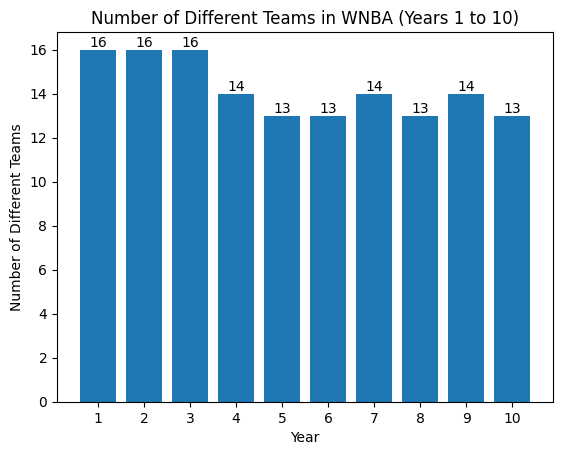

In [7]:
# Initialize empty lists to store years and team counts
years = []
team_counts = []

# Loop through years 1 to 10 and count unique teams for each year
for year in range(1, 11):
    filtered_df = df_teams[df_teams['year'] == year]
    team_count = filtered_df['tmID'].nunique()
    years.append(year)
    team_counts.append(team_count)

# Create a bar chart
plt.bar(years, team_counts)
plt.xlabel('Year')
plt.ylabel('Number of Different Teams')
plt.title('Number of Different Teams in WNBA (Years 1 to 10)')

for i, count in enumerate(team_counts):
    plt.text(years[i], count, str(count), ha='center', va='bottom')
plt.xticks(years)
plt.show()

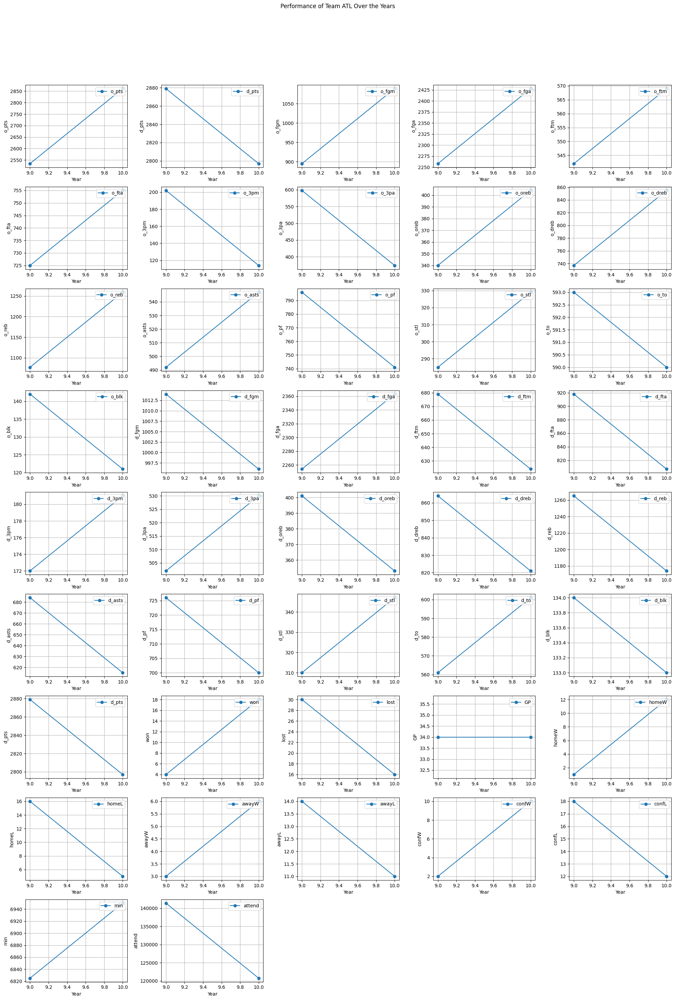

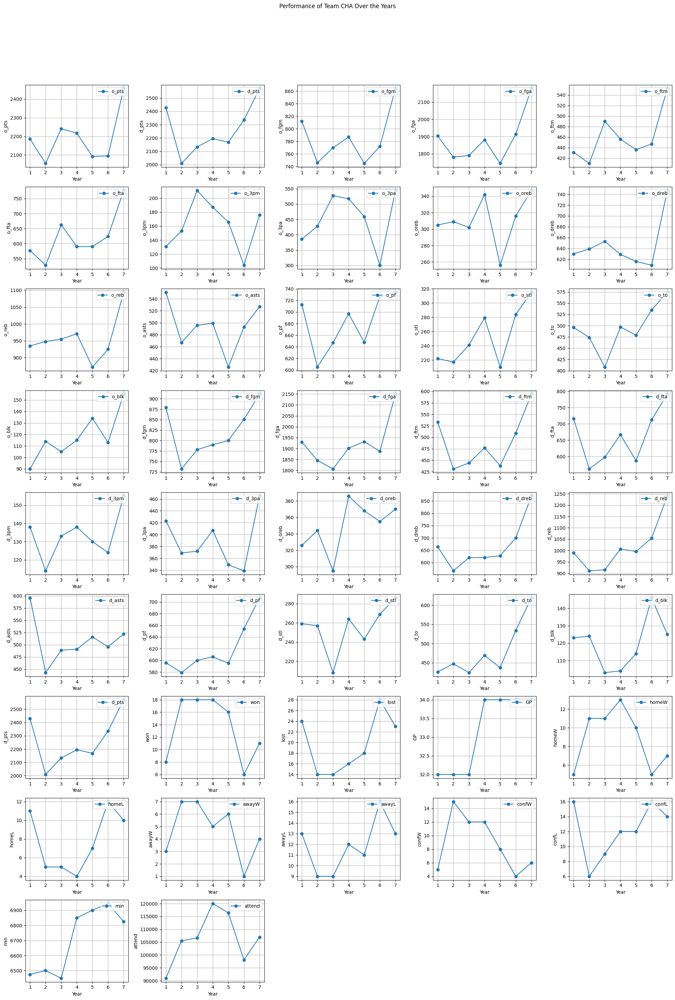

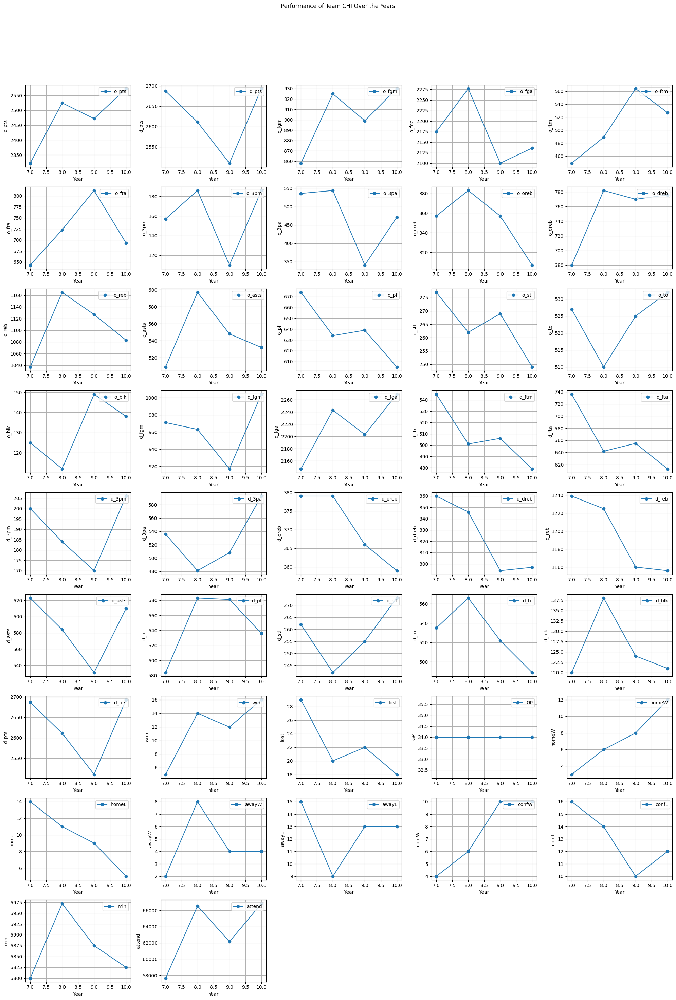

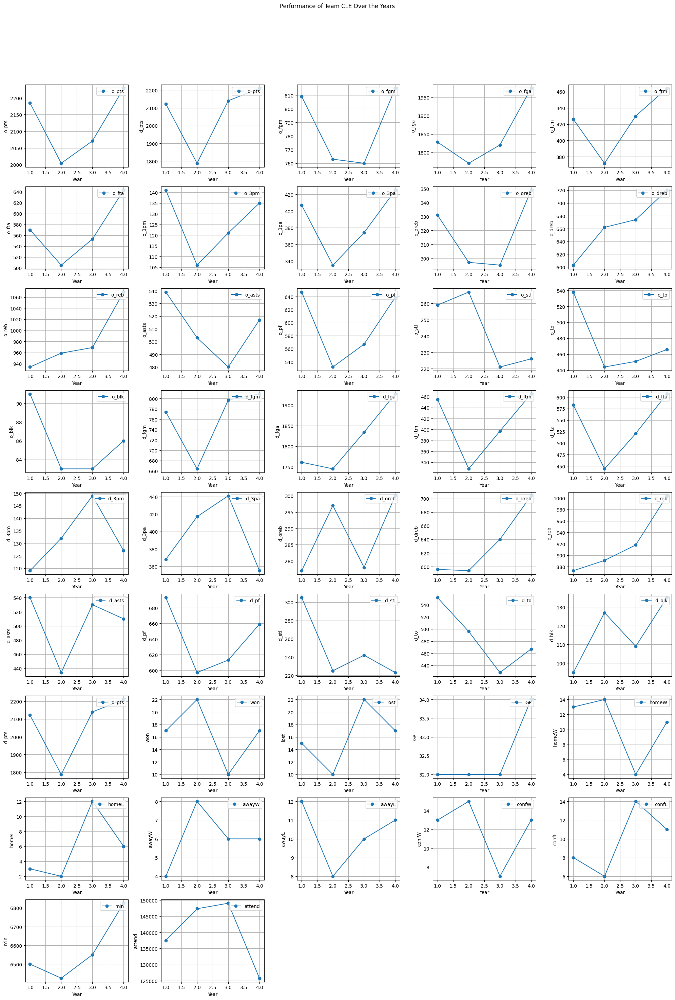

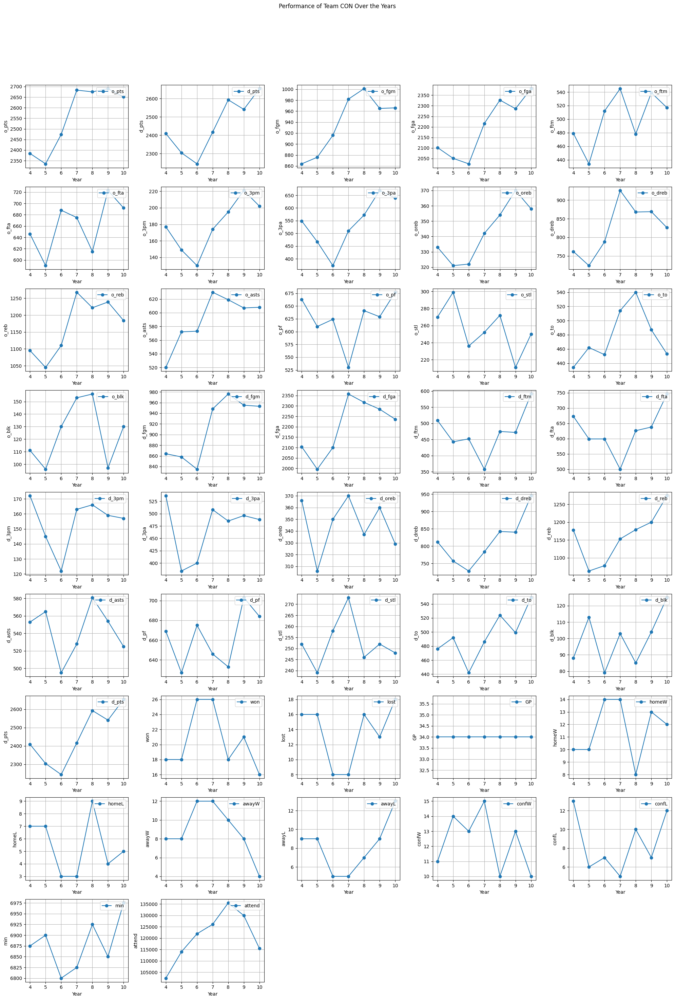

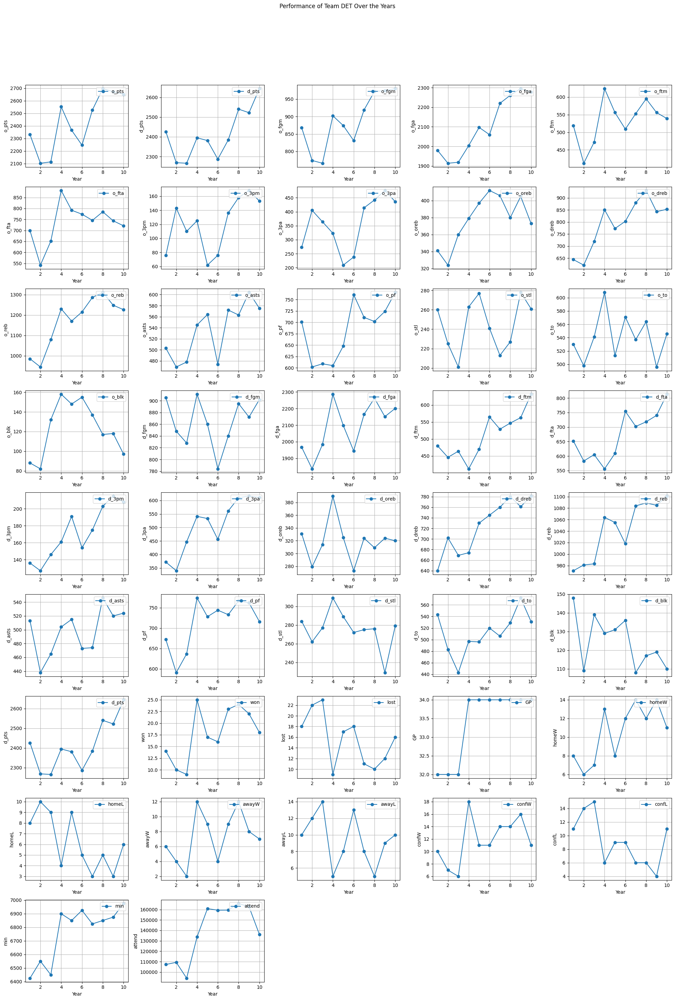

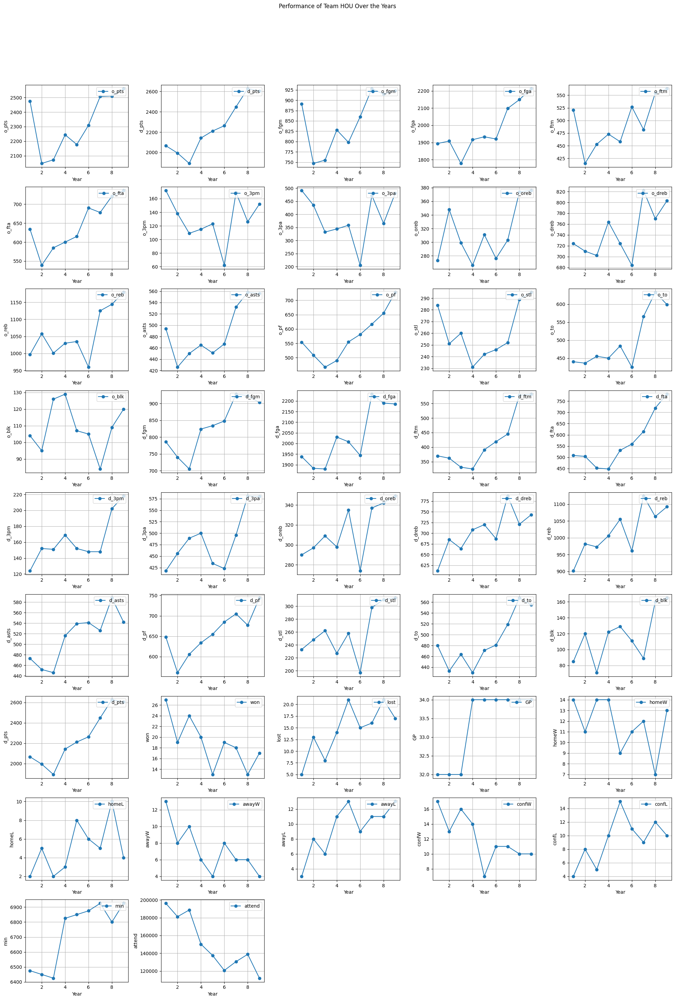

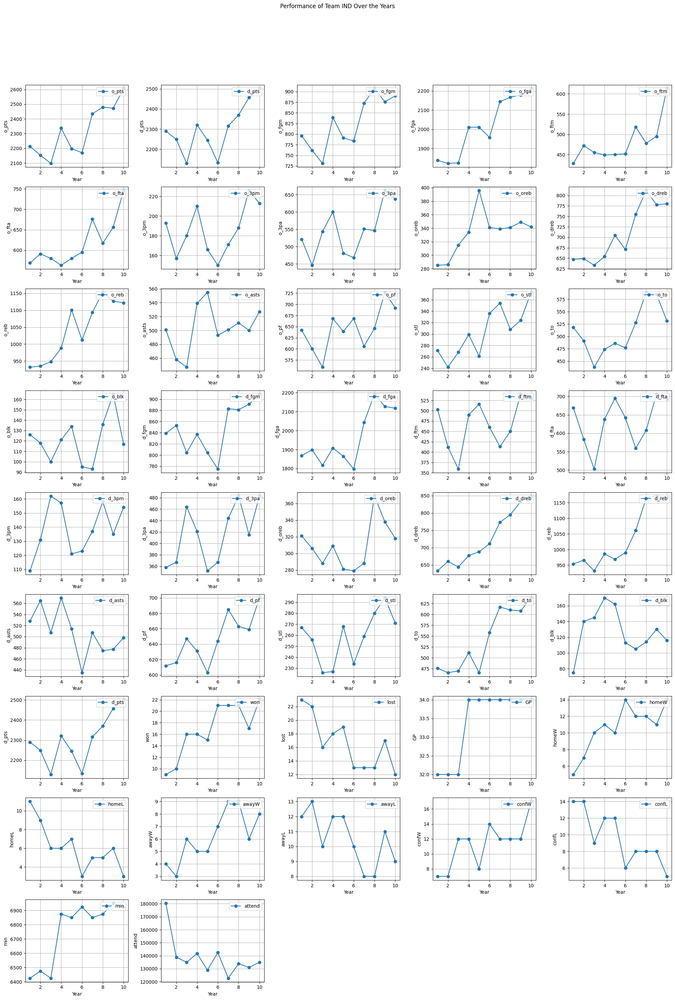

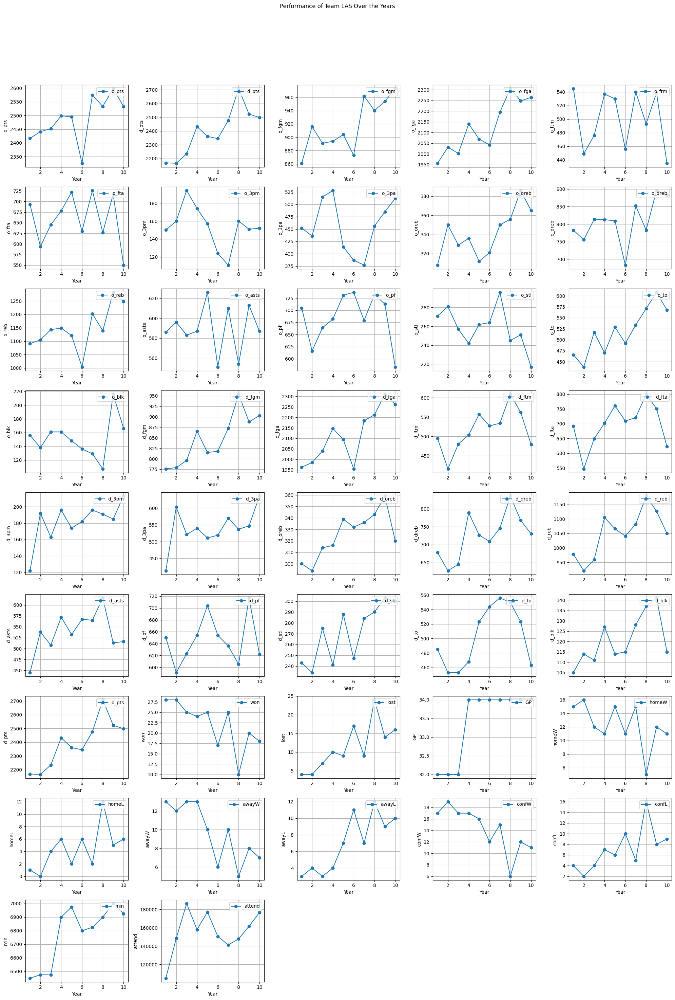

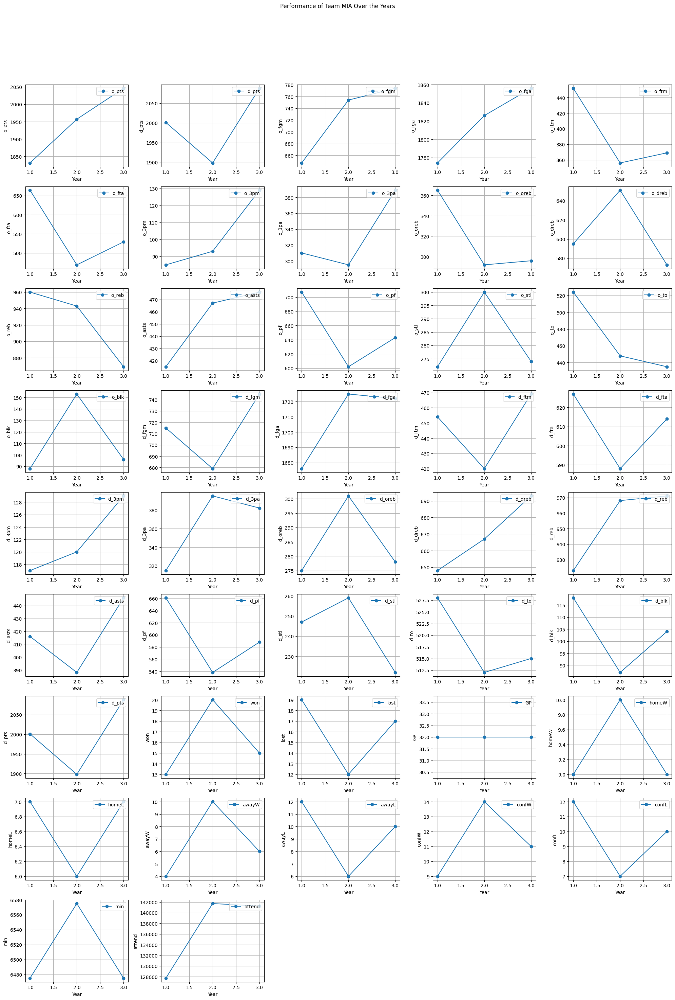

KeyboardInterrupt: 

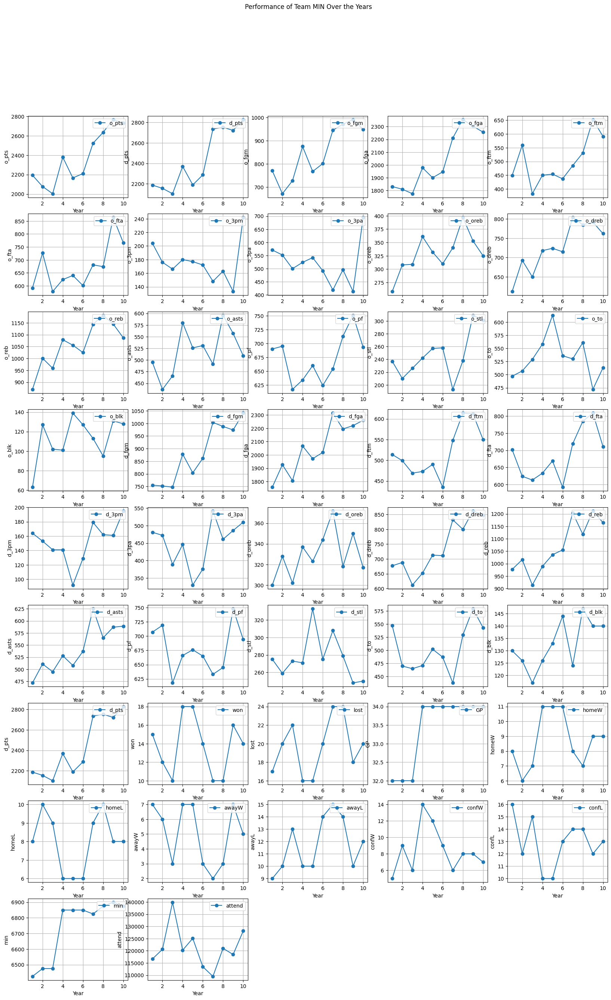

In [8]:
team_names = df_teams['tmID'].unique()
df_teams = df_teams.sort_values(by=['year']).reset_index(drop=True)
columns_to_analyze = ['o_pts', 'd_pts', 'o_fgm', 'o_fga', 'o_ftm', 'o_fta', 'o_3pm', 'o_3pa',
                      'o_oreb', 'o_dreb', 'o_reb', 'o_asts', 'o_pf', 'o_stl', 'o_to', 'o_blk',
                      'd_fgm', 'd_fga', 'd_ftm', 'd_fta', 'd_3pm', 'd_3pa', 'd_oreb', 'd_dreb',
                      'd_reb', 'd_asts', 'd_pf', 'd_stl', 'd_to', 'd_blk', "d_pts","won","lost","GP","homeW","homeL","awayW","awayL","confW","confL","min","attend"]
num_columns = 5  # Adjust as needed
num_rows = len(columns_to_analyze) // num_columns + 1

# Iterate through teams and create a grid of subplots for each team
for team_name in team_names:
    team_data = df_teams[df_teams['tmID'] == team_name]

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 30))
    axes = axes.flatten()  # Flatten the 2D array to a 1D array for indexing

    for i, column in enumerate(columns_to_analyze):
        axes[i].plot(team_data['year'], team_data[column], label=f'{column}', marker='o')
        axes[i].set_xlabel('Year')
        axes[i].set_ylabel(f'{column}')
        axes[i].legend(loc='upper right')
        axes[i].grid(True)

    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'Performance of Team {team_name} Over the Years')
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

In this we can see that away win, away lost, conf win, conf lost, win and lost, are all related to each other

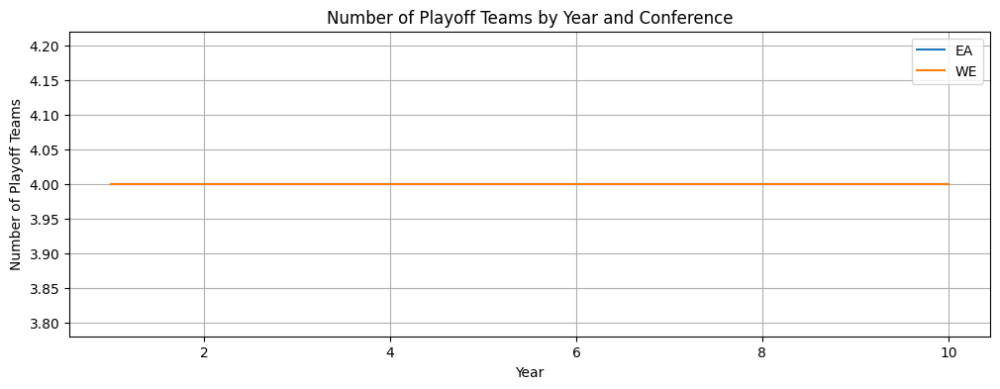

In [ ]:
# Filter the dataset to include only rows with playoff information
playoff_data = df_teams[df_teams['playoff'] == 'Y']

# Group the filtered data by year and conference and count the number of teams
playoff_counts = playoff_data.groupby(['year', 'confID']).size().unstack().fillna(0)

# Plot the data
fig, ax = plt.subplots(figsize=(12, 4))

# Iterate through each conference
for conference in playoff_counts.columns:
    ax.plot(playoff_counts.index, playoff_counts[conference], label=f'{conference}')

ax.set_xlabel('Year')
ax.set_ylabel('Number of Playoff Teams')
ax.set_title('Number of Playoff Teams by Year and Conference')
ax.legend()
plt.grid(True)
plt.show()

## Teams Post

In [ ]:
df_teams_post.head()

,year,tmID,lgID,W,L
0,1,HOU,WNBA,6,0
1,1,ORL,WNBA,1,2
2,1,CLE,WNBA,3,3
3,1,WAS,WNBA,0,2
4,1,NYL,WNBA,4,3


In [ ]:
df_teams_post.describe()

,year,W,L
count,80.000000,80.000000,80.000000
mean,5.500000,2.350000,2.350000
std,2.890403,2.228129,0.843441
min,1.000000,0.000000,0.000000
25%,3.000000,1.000000,2.000000
50%,5.500000,1.500000,2.000000
75%,8.000000,3.250000,3.000000
max,10.000000,7.000000,5.000000


In [ ]:
df_teams_post.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80 entries, 0 to 79
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   year    80 non-null     int64 
 1   tmID    80 non-null     object
 2   lgID    80 non-null     object
 3   W       80 non-null     int64 
 4   L       80 non-null     int64 
dtypes: int64(3), object(2)
memory usage: 3.2+ KB


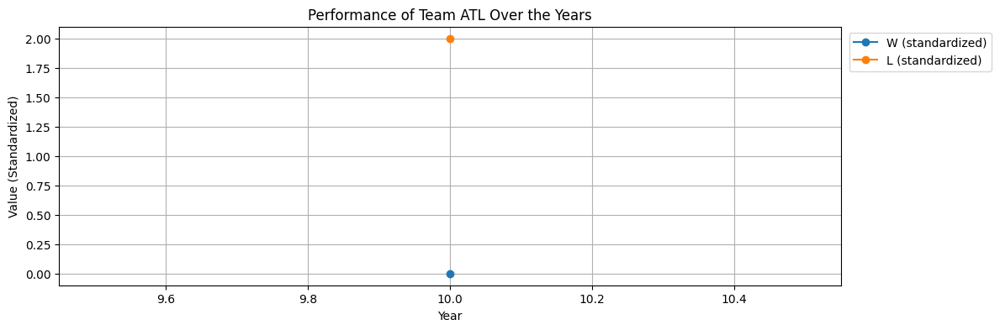

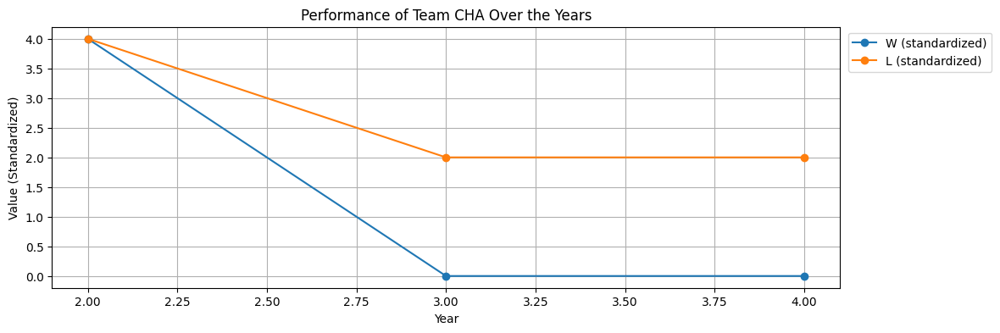

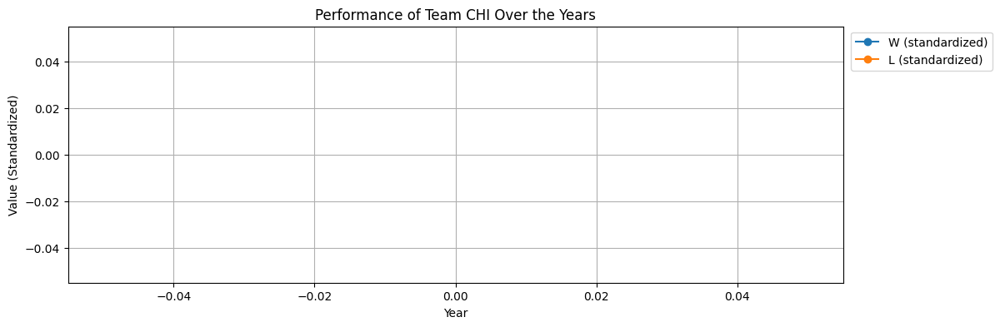

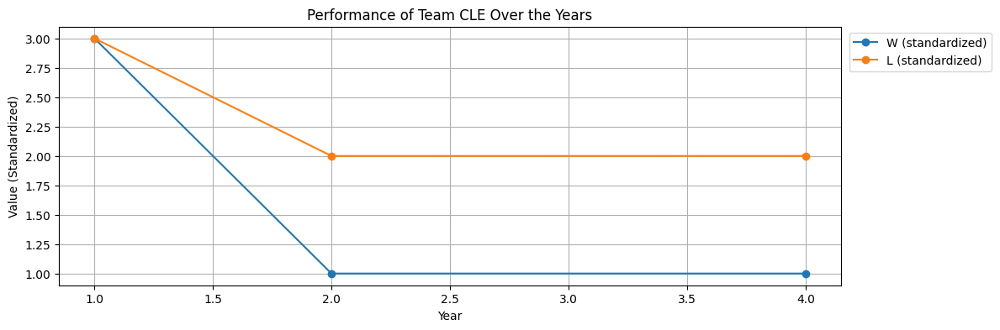

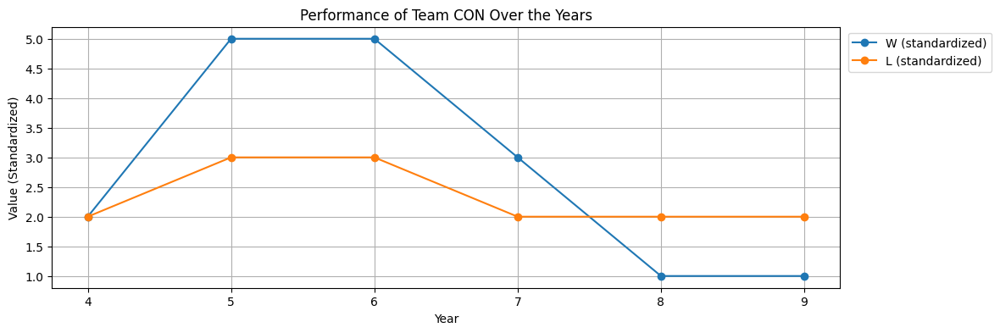

...

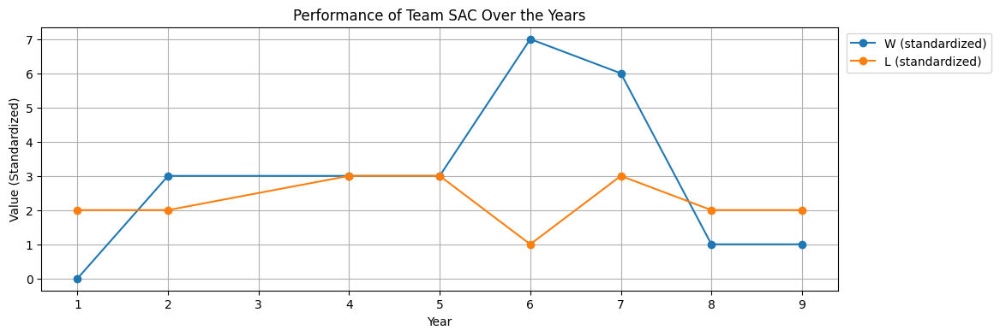

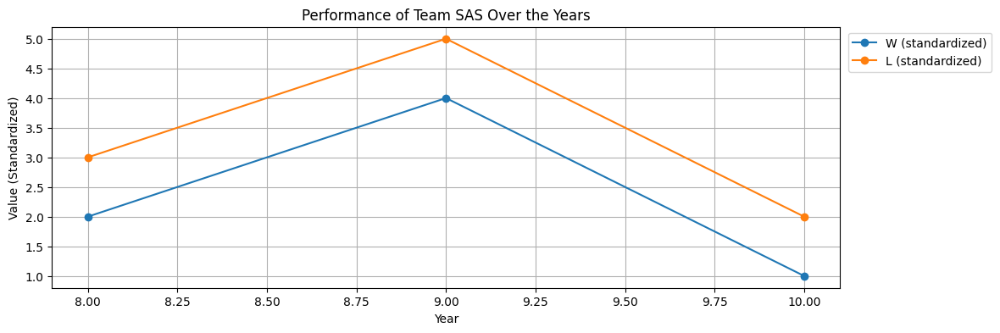

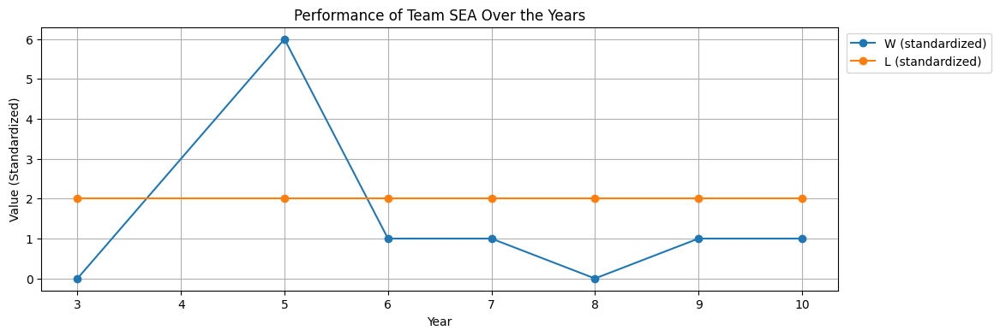

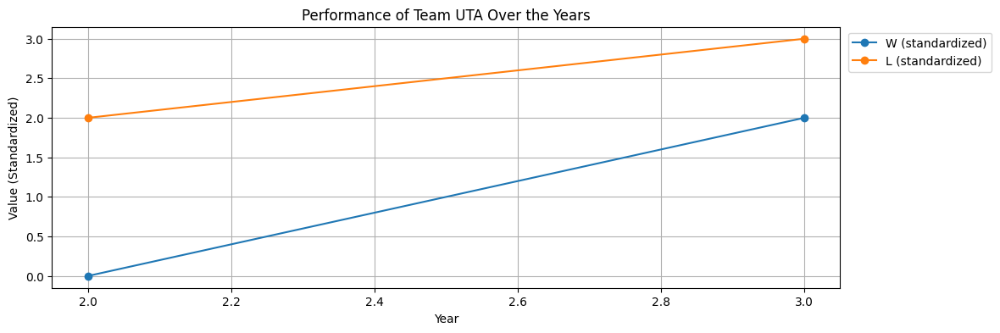

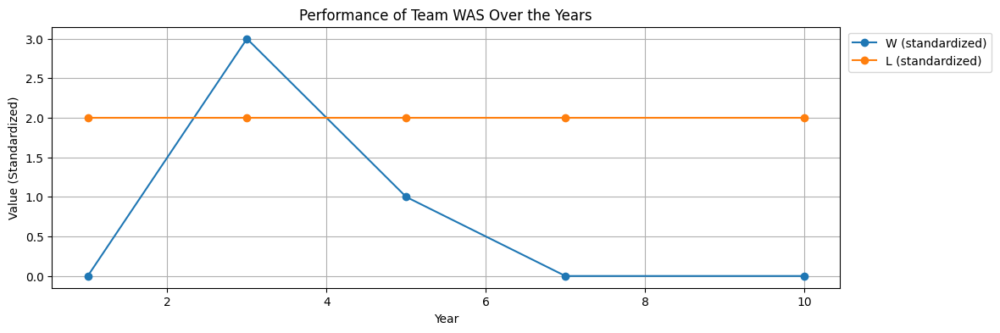

In [ ]:
df_teams_post = df_teams_post.sort_values(by=['year']).reset_index(drop=True)

# Define the columns to analyze (excluding "W" and "L")
columns_to_analyze = ['W', 'L']
# Add other characteristics to analyze as needed

# Iterate through teams and create a single plot for each team with all characteristics
for team_name in team_names:
    team_data = df_teams_post[df_teams_post['tmID'] == team_name]

    plt.figure(figsize=(12, 4))
    for column in columns_to_analyze:
        plt.plot(team_data['year'], team_data[column], label=f'{column} (standardized)', marker='o')
    # Include other characteristics in the plot
    # Add lines similar to the above 'for' loop for additional columns

    plt.xlabel('Year')
    plt.ylabel('Value (Standardized)')
    plt.title(f'Performance of Team {team_name} Over the Years')
    plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
    plt.grid(True)
    plt.show()

Not all temas have team post data, could be a problem

## Series post

In [ ]:
df_series_post.head()

,year,round,series,tmIDWinner,lgIDWinner,tmIDLoser,lgIDLoser,W,L
0,1,FR,A,CLE,WNBA,ORL,WNBA,2,1
1,1,FR,B,NYL,WNBA,WAS,WNBA,2,0
2,1,FR,C,LAS,WNBA,PHO,WNBA,2,0
3,1,FR,D,HOU,WNBA,SAC,WNBA,2,0
4,1,CF,E,HOU,WNBA,LAS,WNBA,2,0


In [ ]:
df_series_post.describe()

,year,W,L
count,70.00000,70.000000,70.000000
mean,5.50000,2.071429,0.614286
std,2.89302,0.259399,0.572127
min,1.00000,2.000000,0.000000
25%,3.00000,2.000000,0.000000
50%,5.50000,2.000000,1.000000
75%,8.00000,2.000000,1.000000
max,10.00000,3.000000,2.000000


In [ ]:
df_series_post.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70 entries, 0 to 69
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   year        70 non-null     int64 
 1   round       70 non-null     object
 2   series      70 non-null     object
 3   tmIDWinner  70 non-null     object
 4   lgIDWinner  70 non-null     object
 5   tmIDLoser   70 non-null     object
 6   lgIDLoser   70 non-null     object
 7   W           70 non-null     int64 
 8   L           70 non-null     int64 
dtypes: int64(3), object(6)
memory usage: 5.0+ KB


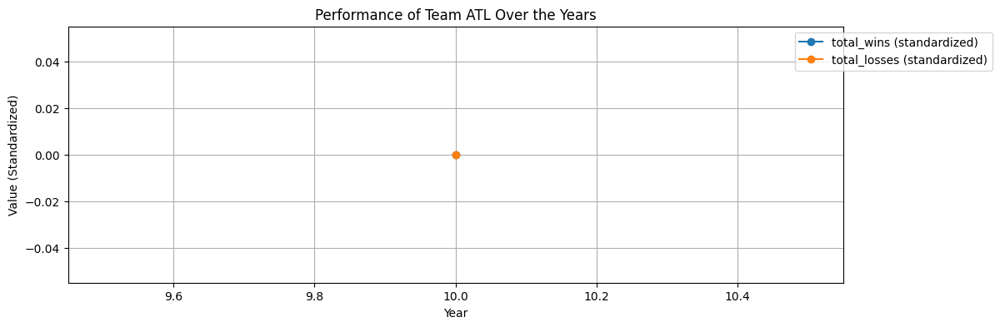

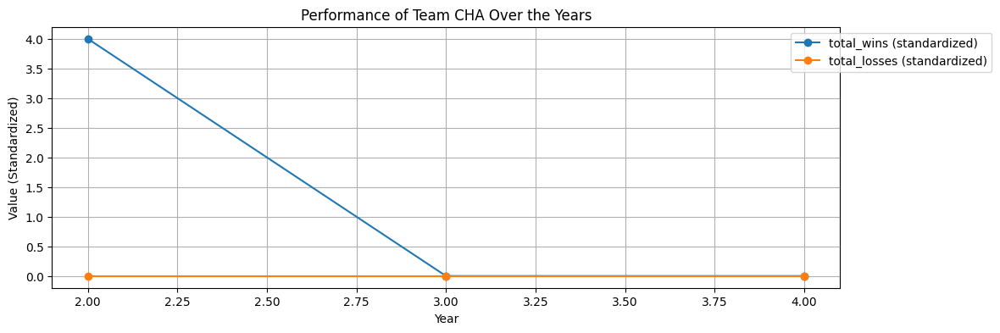

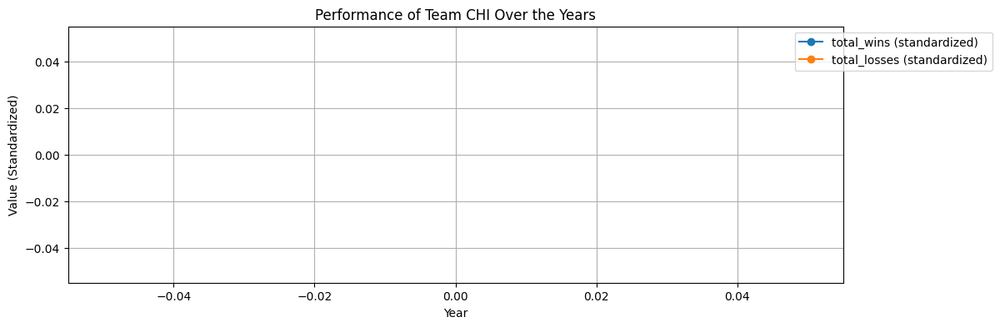

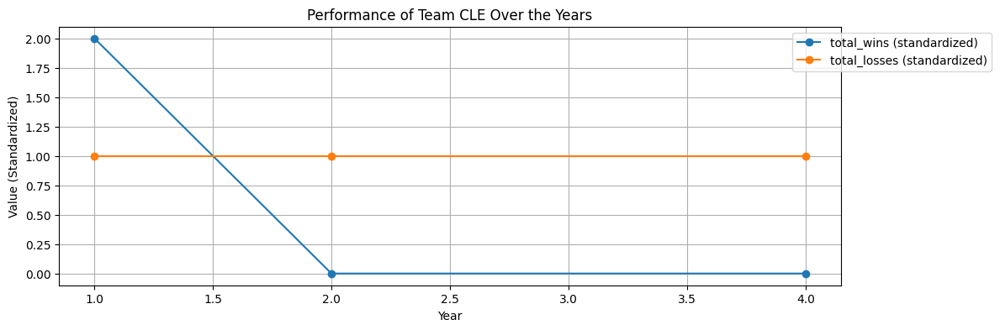

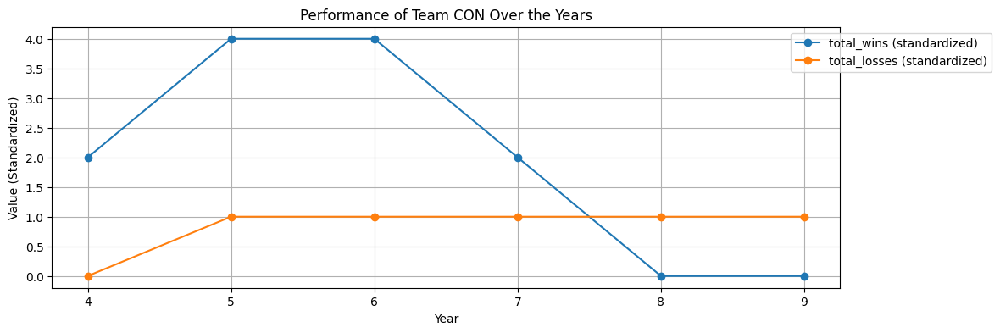

...

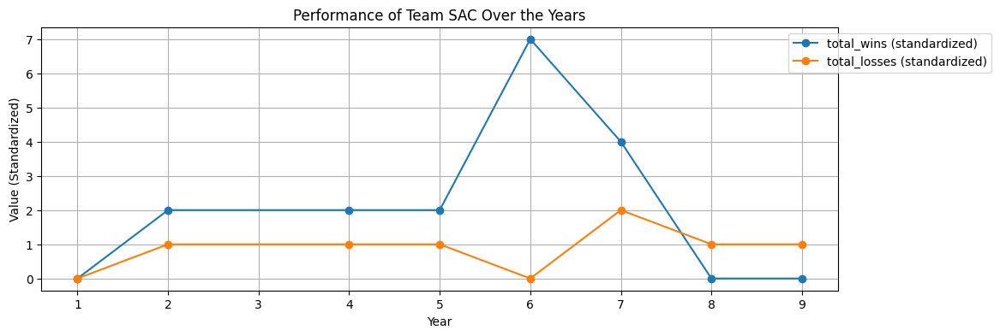

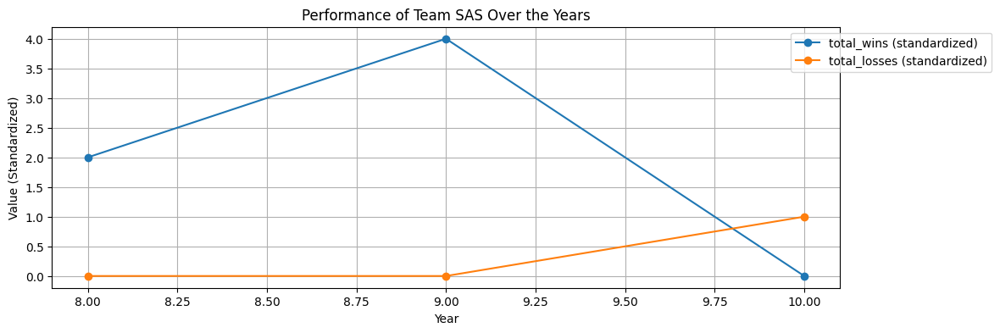

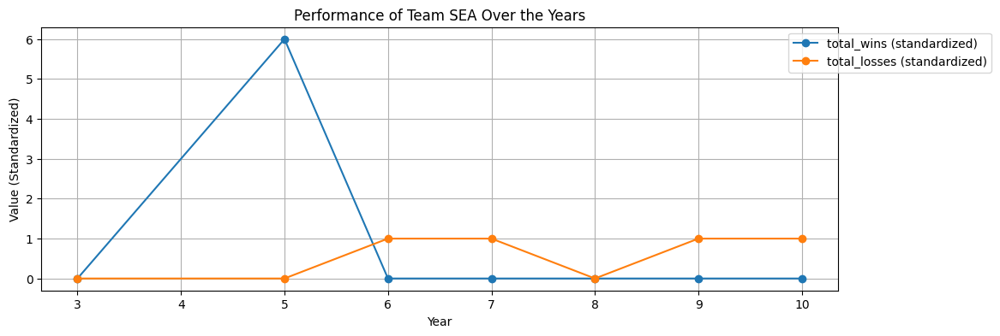

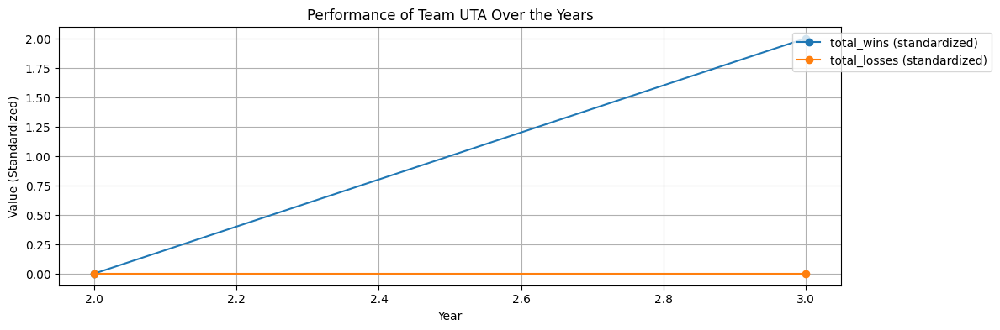

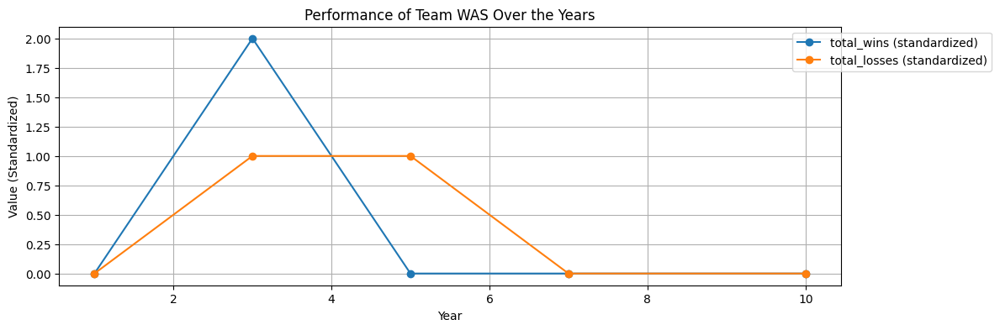

In [ ]:
winning_team_stats = df_series_post.groupby(["year", "tmIDWinner"])[["W"]].sum().reset_index()
winning_team_stats.columns = ["year", "tmID", "total_wins"]

losing_team_stats = df_series_post.groupby(["year", "tmIDLoser"])[["L"]].sum().reset_index()
losing_team_stats.columns = ["year", "tmID", "total_losses"]

# Merge the winning and losing team statistics
team_stats = winning_team_stats.merge(losing_team_stats, on=["year", "tmID"], how="outer").fillna(0)

team_stats = team_stats.sort_values(by=['year']).reset_index(drop=True)

# Define the columns to analyze (excluding "W" and "L")
columns_to_analyze = ['total_wins', 'total_losses']
# Add other characteristics to analyze as needed

# Iterate through teams and create a single plot for each team with all characteristics
for team_name in team_names:
    team_data = team_stats[team_stats['tmID'] == team_name]

    plt.figure(figsize=(12, 4))
    for column in columns_to_analyze:
        plt.plot(team_data['year'], team_data[column], label=f'{column} (standardized)', marker='o')
    # Include other characteristics in the plot
    # Add lines similar to the above 'for' loop for additional columns

    plt.xlabel('Year')
    plt.ylabel('Value (Standardized)')
    plt.title(f'Performance of Team {team_name} Over the Years')
    plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
    plt.grid(True)
    plt.show()

Some teams don't have series post data, could be a problem

## Players

In [ ]:
df_players.head()

,bioID,pos,firstseason,lastseason,height,weight,college,collegeOther,birthDate,deathDate
0,abrahta01w,C,0,0,74.0,190,George Washington,NaN,1975-09-27,0000-00-00
1,abrossv01w,F,0,0,74.0,169,Connecticut,NaN,1980-07-09,0000-00-00
2,adairje01w,C,0,0,76.0,197,George Washington,NaN,1986-12-19,0000-00-00
3,adamsda01w,F-C,0,0,73.0,239,Texas A&M,Jefferson College (JC),1989-02-19,0000-00-00
4,adamsjo01w,C,0,0,75.0,180,New Mexico,NaN,1981-05-24,0000-00-00


In [ ]:
df_players.describe()

,firstseason,lastseason,height,weight
count,893.0,893.0,893.000000,893.000000
mean,0.0,0.0,65.500560,145.415454
std,0.0,0.0,20.940425,61.275703
min,0.0,0.0,0.000000,0.000000
25%,0.0,0.0,68.000000,140.000000
50%,0.0,0.0,72.000000,162.000000
75%,0.0,0.0,75.000000,180.000000
max,0.0,0.0,80.000000,254.000000


In [10]:
df_players.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 893 entries, 0 to 892
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   bioID         893 non-null    object 
 1   pos           815 non-null    object 
 2   firstseason   893 non-null    int64  
 3   lastseason    893 non-null    int64  
 4   height        893 non-null    float64
 5   weight        893 non-null    int64  
 6   college       726 non-null    object 
 7   collegeOther  11 non-null     object 
 8   birthDate     893 non-null    object 
 9   deathDate     893 non-null    object 
dtypes: float64(1), int64(3), object(6)
memory usage: 69.9+ KB


## Players teams

In [19]:
df_players_teams.head()

,playerID,year,stint,tmID,lgID,GP,GS,minutes,points,oRebounds,...,PostBlocks,PostTurnovers,PostPF,PostfgAttempted,PostfgMade,PostftAttempted,PostftMade,PostthreeAttempted,PostthreeMade,PostDQ
0,abrossv01w,2,0,MIN,WNBA,26,23,846,343,43,...,0,0,0,0,0,0,0,0,0,0
1,abrossv01w,3,0,MIN,WNBA,27,27,805,314,45,...,0,0,0,0,0,0,0,0,0,0
2,abrossv01w,4,0,MIN,WNBA,30,25,792,318,44,...,1,8,8,22,6,8,8,7,3,0
3,abrossv01w,5,0,MIN,WNBA,22,11,462,146,17,...,2,3,7,23,8,4,2,8,2,0
4,abrossv01w,6,0,MIN,WNBA,31,31,777,304,29,...,0,0,0,0,0,0,0,0,0,0


In [20]:
df_players_teams.describe()

,year,stint,GP,GS,minutes,points,oRebounds,dRebounds,rebounds,assists,...,PostBlocks,PostTurnovers,PostPF,PostfgAttempted,PostfgMade,PostftAttempted,PostftMade,PostthreeAttempted,PostthreeMade,PostDQ
count,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,...,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000,1876.000000
mean,5.326226,0.113539,24.320896,12.438166,501.269190,176.261727,24.388060,54.334755,78.722814,39.031983,...,0.759062,2.623134,3.735075,12.282516,5.149254,3.672708,2.822495,2.924307,1.019723,0.026652
std,2.905475,0.422574,10.460614,13.641697,359.566117,161.983839,23.325974,48.347088,69.210226,40.147037,...,2.280011,5.037807,6.697874,24.313379,10.726421,8.463917,6.723170,7.751034,2.992637,0.170751
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,0.000000,17.000000,0.000000,165.000000,41.000000,6.000000,15.000000,21.000000,8.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.000000,0.000000,29.000000,5.000000,459.000000,129.000000,18.000000,42.000000,63.000000,26.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,8.000000,0.000000,32.000000,29.000000,826.250000,284.000000,36.000000,83.000000,119.000000,57.250000,...,0.000000,3.000000,5.000000,15.000000,6.000000,4.000000,2.000000,1.000000,0.000000,0.000000
max,10.000000,3.000000,34.000000,34.000000,1234.000000,860.000000,162.000000,276.000000,363.000000,236.000000,...,31.000000,34.000000,43.000000,188.000000,82.000000,68.000000,62.000000,85.000000,32.000000,2.000000


In [ ]:
df_players_teams.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1876 entries, 0 to 1875
Data columns (total 43 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   playerID            1876 non-null   object
 1   year                1876 non-null   int64 
 2   stint               1876 non-null   int64 
 3   tmID                1876 non-null   object
 4   lgID                1876 non-null   object
 5   GP                  1876 non-null   int64 
 6   GS                  1876 non-null   int64 
 7   minutes             1876 non-null   int64 
 8   points              1876 non-null   int64 
 9   oRebounds           1876 non-null   int64 
 10  dRebounds           1876 non-null   int64 
 11  rebounds            1876 non-null   int64 
 12  assists             1876 non-null   int64 
 13  steals              1876 non-null   int64 
 14  blocks              1876 non-null   int64 
 15  turnovers           1876 non-null   int64 
 16  PF                  1876

In [24]:

df_players_teams['Postperformance'] = (df_players_teams['PostPoints'] + df_players_teams['PostRebounds'] +
                           df_players_teams['PostAssists'] + df_players_teams['PostSteals'] +
                           df_players_teams['PostBlocks']) - (df_players_teams['PostTurnovers'] +
                           0.4*df_players_teams['PostPF'])   
df_players_teams['performance'] = (df_players_teams['points'] + df_players_teams['rebounds'] +
                           df_players_teams['assists'] + df_players_teams['steals'] +
                           df_players_teams['blocks']) - (df_players_teams['turnovers'] +
                           0.4*df_players_teams['PF'])   
points_made = 1 * df_players_teams['ftMade'] + 2 * (df_players_teams['fgMade'] - df_players_teams['threeMade']) + 3 * df_players_teams['threeMade']
points_attempted = 1 * df_players_teams['ftAttempted'] + 2 * (df_players_teams['fgAttempted'] - df_players_teams['threeAttempted']) + 3 * df_players_teams['threeAttempted']
df_players_teams['points_precision'] = points_attempted - points_made

post_points_made = 1 * df_players_teams['PostftMade'] + 2 * (df_players_teams['PostfgMade'] - df_players_teams['PostthreeMade']) + 3 * df_players_teams['PostthreeMade']
post_points_attempted = 1 * df_players_teams['PostftAttempted'] + 2 * (df_players_teams['PostfgAttempted'] - df_players_teams['PostthreeAttempted']) + 3 * df_players_teams['PostthreeAttempted']
df_players_teams['Postpoints_precision'] = post_points_attempted - post_points_made

df_players_teams.drop(columns=['points', 'rebounds', 'assists', 'steals', 'blocks', 'turnovers', 'PF', 'PostPoints', 'PostRebounds', 'PostAssists', 'PostSteals', 'PostBlocks', 'PostTurnovers', 'PostPF'], inplace=True)
df_players_teams.drop(columns=['ftMade', 'fgMade', 'threeMade', 'fgAttempted', 'ftAttempted', 'threeAttempted', 'PostftMade', 'PostfgMade', 'PostthreeMade', 'PostfgAttempted', 'PostftAttempted', 'PostthreeAttempted'], inplace=True)

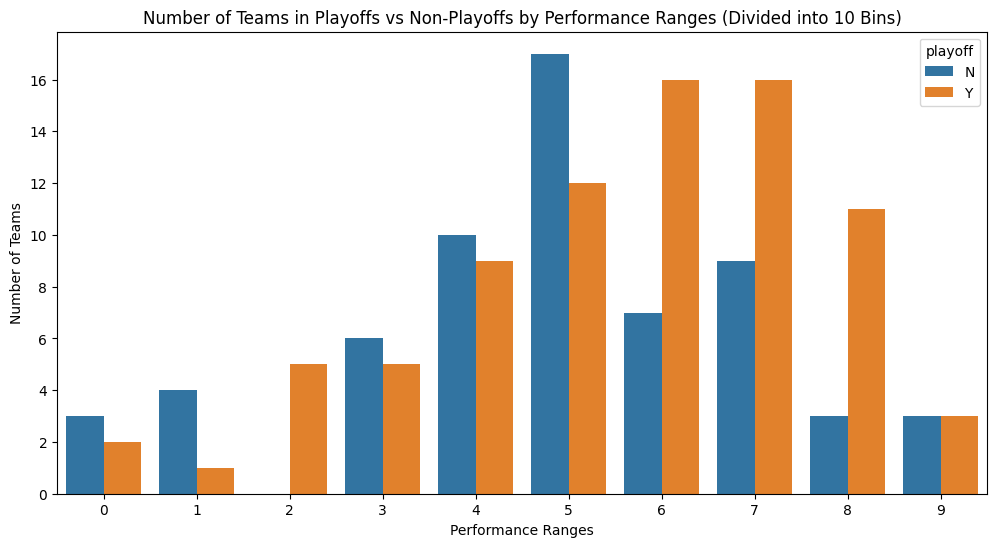

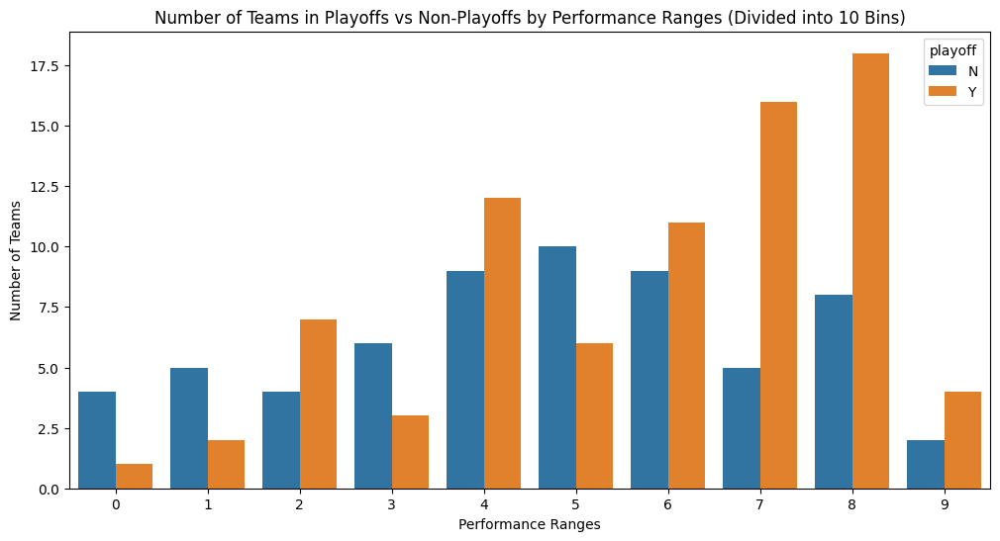

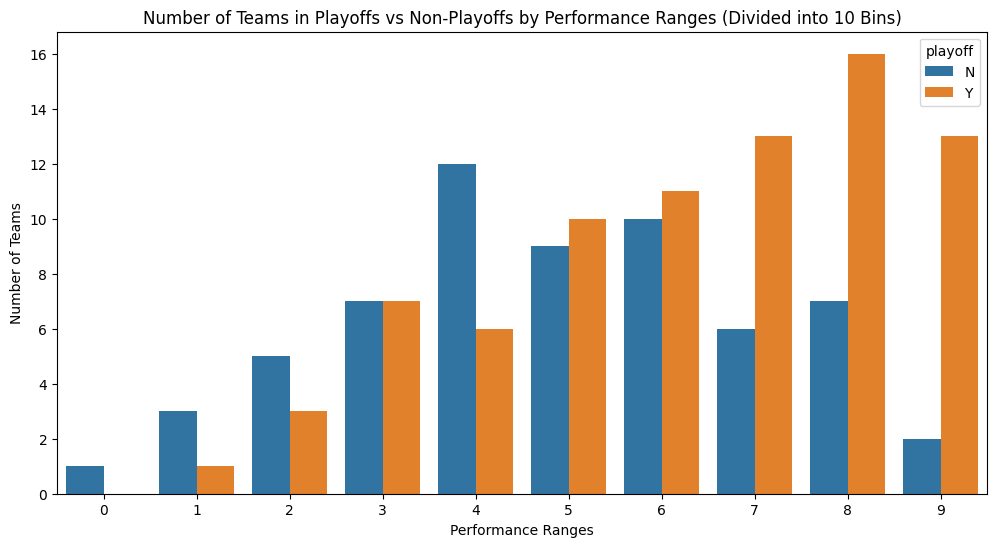

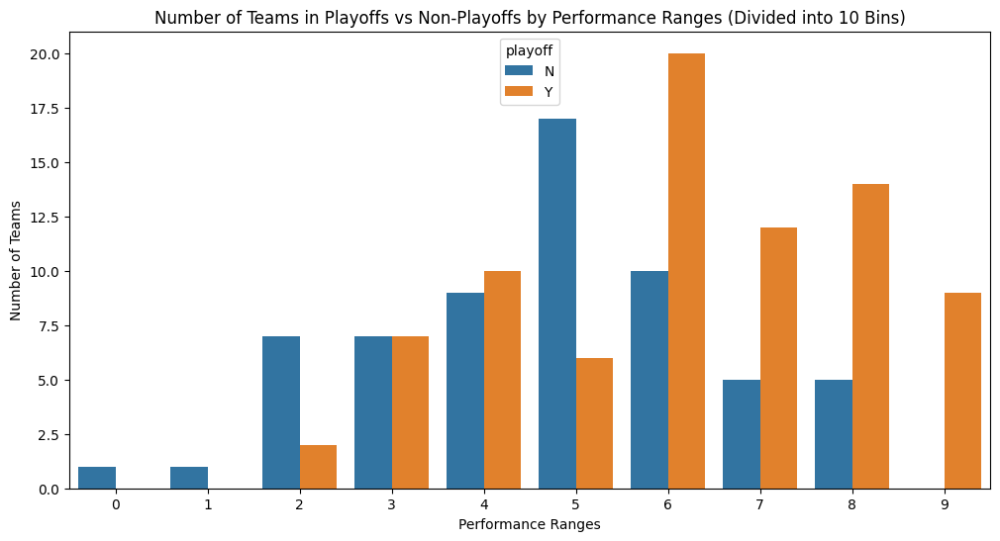

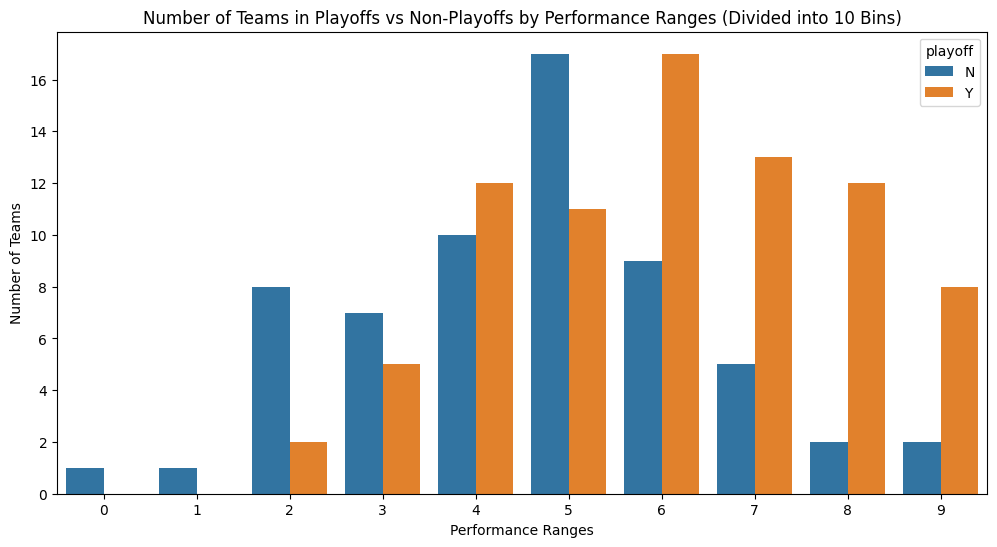

In [26]:
# Specify the number of bins (ranges)
num_bins = 10
for i in range(1, 6):
    df_players_teams_a = df_players_teams.groupby(['tmID', 'year']).apply(lambda group: group.nlargest(i, 'minutes')).reset_index(drop=True)

    agg_players_df = df_players_teams_a.groupby(["year", "tmID"]).agg({
        "GP": "mean",
        "GS": "mean",
        "minutes": "mean",
        "oRebounds": "mean",
        "dRebounds": "mean",
        "dq": "mean",
        "PostGP": "mean",
        "PostGS": "mean",
        "PostMinutes": "mean",
        "PostoRebounds": "mean",
        "PostdRebounds": "mean",
        "performance": "mean",
        "Postperformance": "mean",
        'points_precision': 'mean',
        'Postpoints_precision': 'mean',
        "PostDQ": "mean",

        # Add more columns you want to aggregate here
    }).reset_index()
    df_teams_graph = pd.merge(df_teams, agg_players_df, on=['year', 'tmID']).fillna(0)

    # Create minute ranges
    df_teams_graph['performance_range'] = pd.cut(df_teams_graph['minutes'], bins=num_bins, labels=False, right=False)

    # Create a new DataFrame for player counts
    player_counts = df_teams_graph.groupby(['playoff', 'performance_range'])['tmID'].count().reset_index()

    # plot barplot with seaborn minutes in x and count in y
    plt.figure(figsize=(12, 6))
    sns.barplot(x='performance_range', y='tmID', hue='playoff', data=player_counts)
    plt.title(f'Number of Teams in Playoffs vs Non-Playoffs by Performance Ranges (Divided into {num_bins} Bins)')
    plt.xlabel('Performance Ranges')
    plt.ylabel('Number of Teams')
    plt.show()

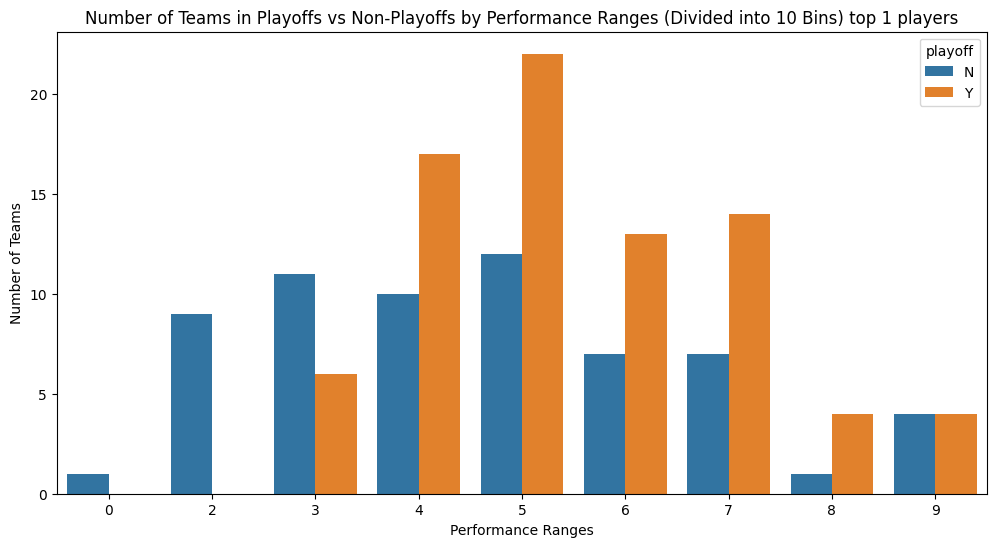

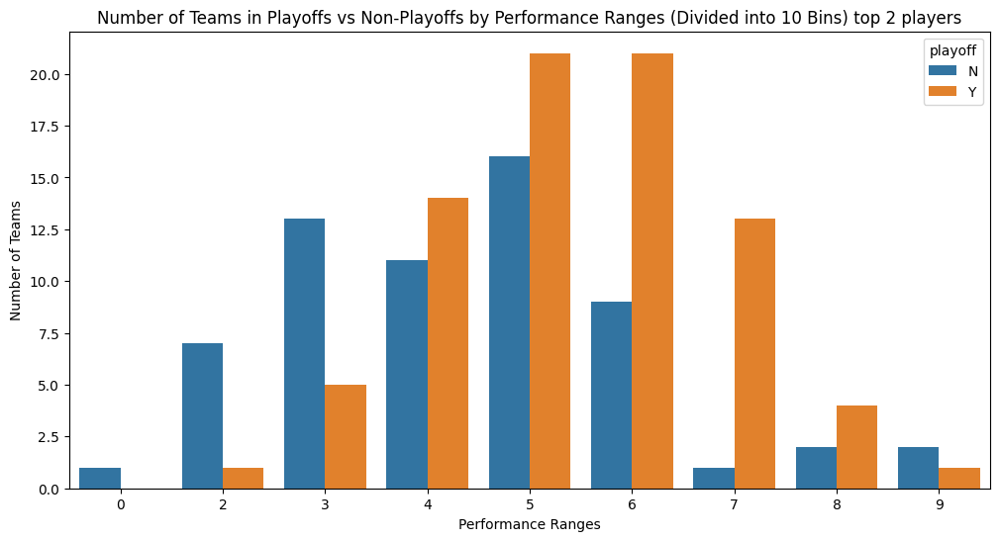

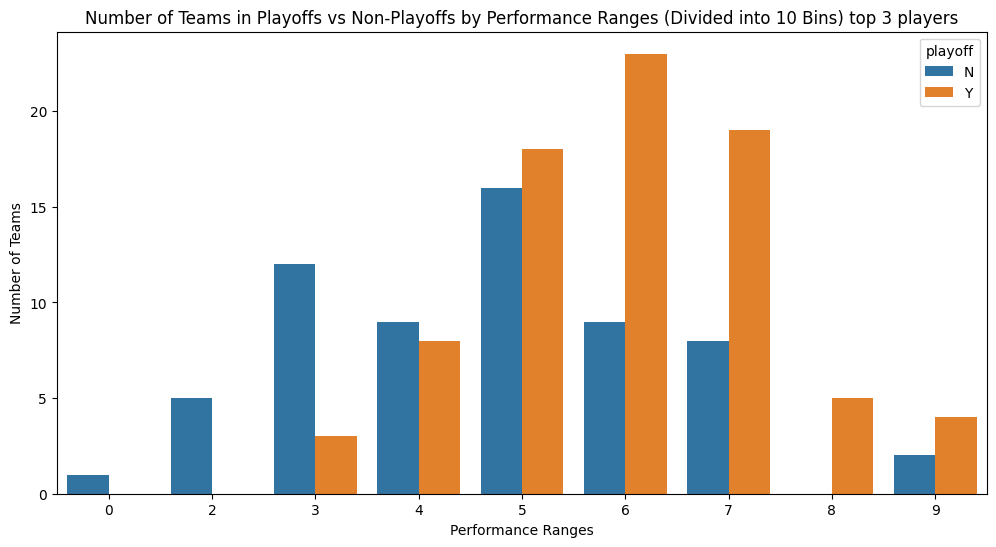

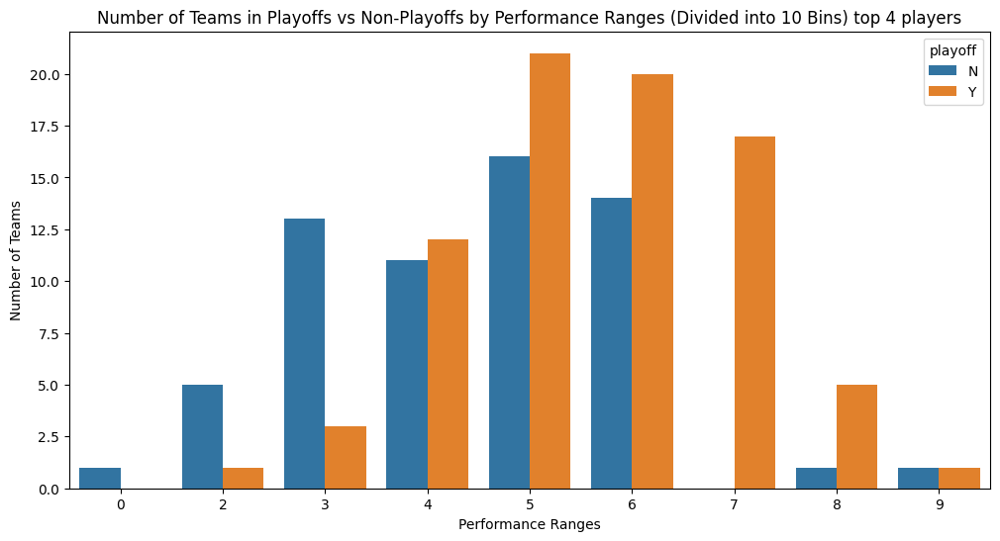

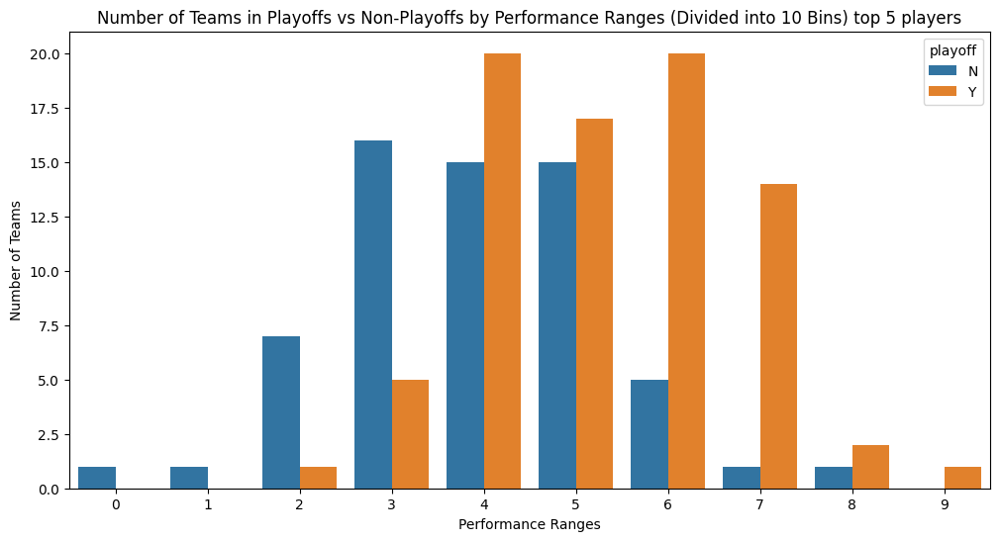

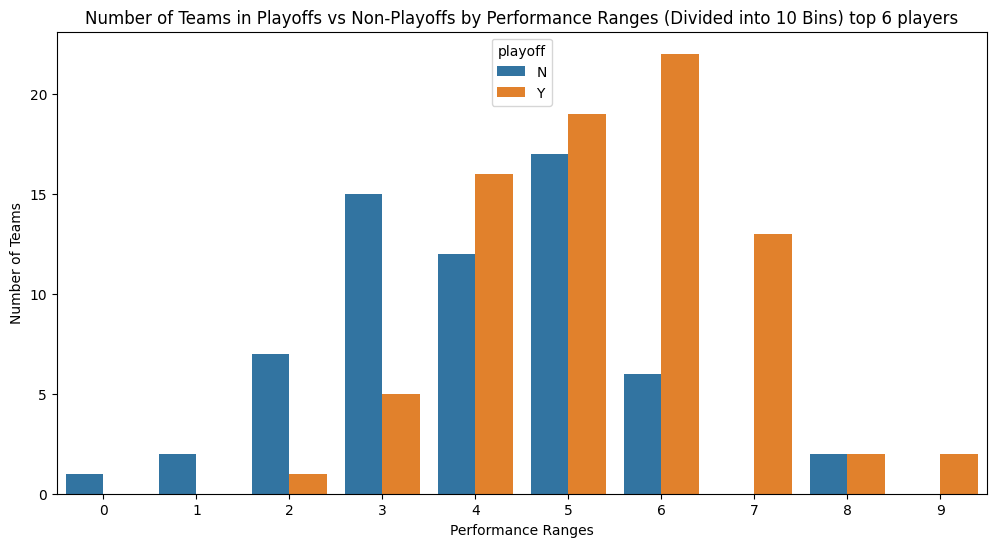

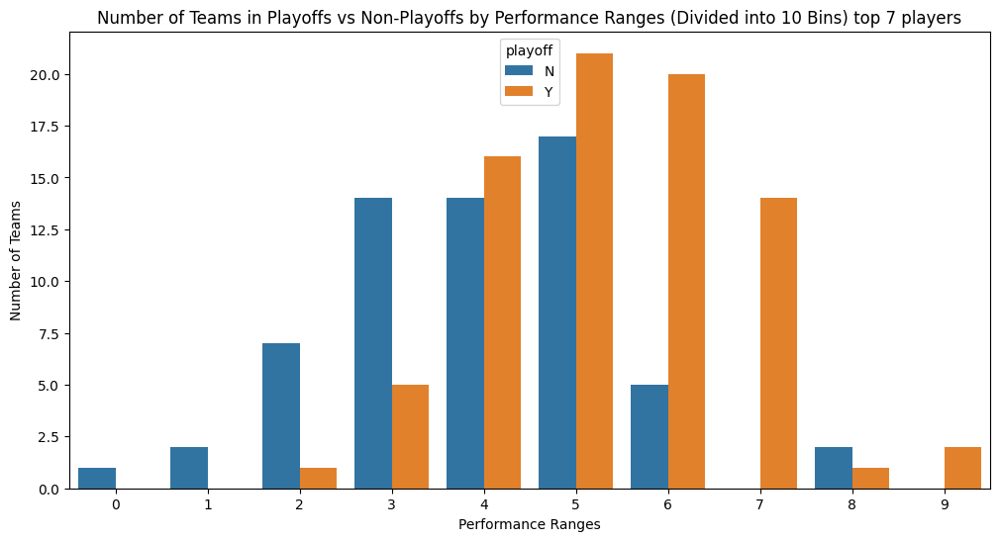

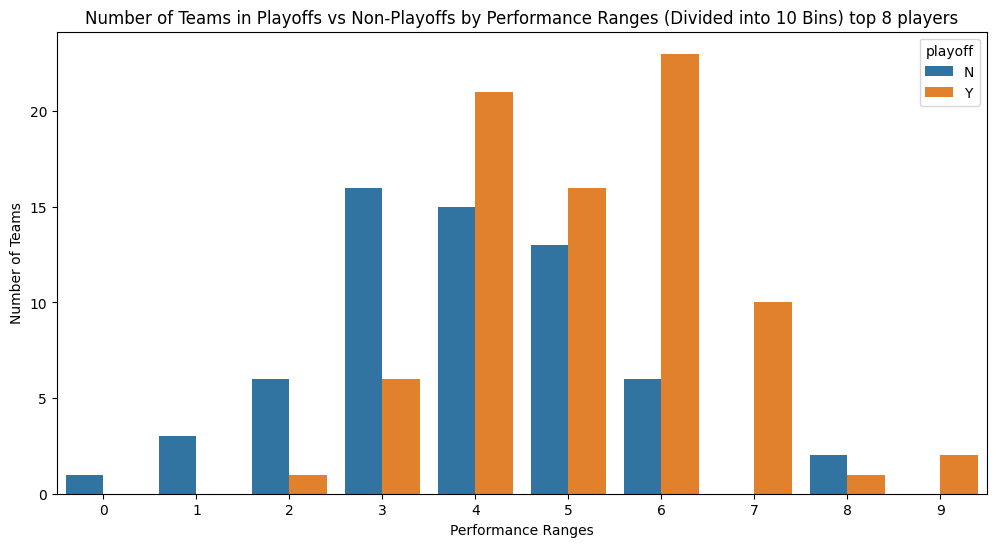

In [28]:
# Specify the number of bins (ranges)
num_bins = 10
for i in range(1, 9):
    df_players_teams_a = df_players_teams.groupby(['tmID', 'year']).apply(lambda group: group.nlargest(i, 'performance')).reset_index(drop=True)

    agg_players_df = df_players_teams_a.groupby(["year", "tmID"]).agg({
        "GP": "mean",
        "GS": "mean",
        "minutes": "mean",
        "oRebounds": "mean",
        "dRebounds": "mean",
        "dq": "mean",
        "PostGP": "mean",
        "PostGS": "mean",
        "PostMinutes": "mean",
        "PostoRebounds": "mean",
        "PostdRebounds": "mean",
        "performance": "mean",
        "Postperformance": "mean",
        'points_precision': 'mean',
        'Postpoints_precision': 'mean',
        "PostDQ": "mean",

        # Add more columns you want to aggregate here
    }).reset_index()
    df_teams_graph = pd.merge(df_teams, agg_players_df, on=['year', 'tmID']).fillna(0)

    # Create minute ranges
    df_teams_graph['performance_range'] = pd.cut(df_teams_graph['performance'], bins=num_bins, labels=False, right=False)

    # Create a new DataFrame for player counts
    player_counts = df_teams_graph.groupby(['playoff', 'performance_range'])['tmID'].count().reset_index()

    # plot barplot with seaborn minutes in x and count in y
    plt.figure(figsize=(12, 6))
    sns.barplot(x='performance_range', y='tmID', hue='playoff', data=player_counts)
    plt.title(f'Number of Teams in Playoffs vs Non-Playoffs by Performance Ranges (Divided into {num_bins} Bins) top {i} players')
    plt.xlabel('Performance Ranges')
    plt.ylabel('Number of Teams')
    plt.show()

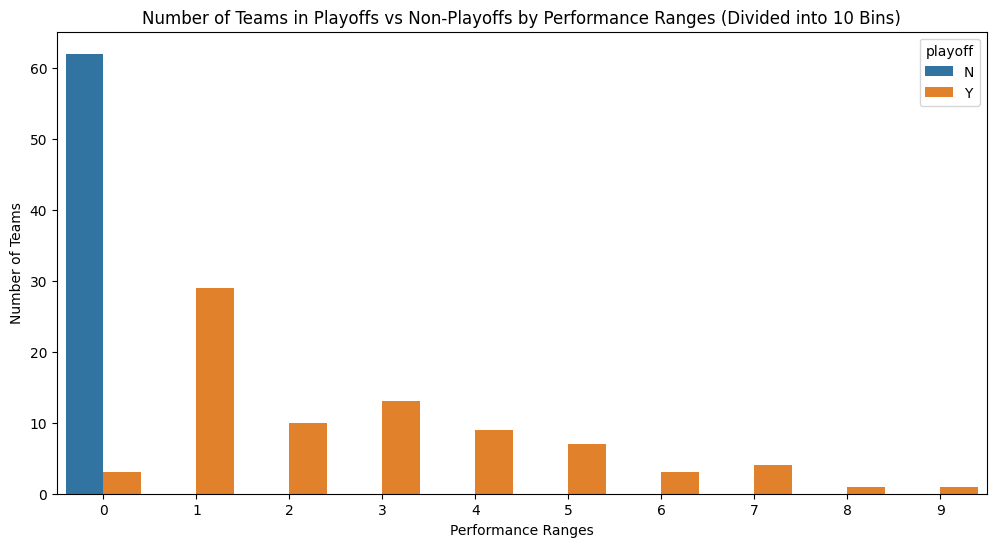

In [16]:
# Specify the number of bins (ranges)
num_bins = 10


agg_players_df = df_players_teams.groupby(["year", "tmID"]).agg({
    "GP": "mean",
    "GS": "mean",
    "minutes": "mean",
    "oRebounds": "mean",
    "dRebounds": "mean",
    "dq": "mean",
    "PostGP": "mean",
    "PostGS": "mean",
    "PostMinutes": "mean",
    "PostoRebounds": "mean",
    "PostdRebounds": "mean",
    "performance": "mean",
    "Postperformance": "mean",
    'points_precision': 'mean',
    'Postpoints_precision': 'mean',
    "PostDQ": "mean",

    # Add more columns you want to aggregate here
}).reset_index()
df_teams_graph = pd.merge(df_teams, agg_players_df, on=['year', 'tmID']).fillna(0)

# Create minute ranges
df_teams_graph['performance_range'] = pd.cut(df_teams_graph['Postperformance'], bins=num_bins, labels=False, right=False)

# Create a new DataFrame for player counts
player_counts = df_teams_graph.groupby(['playoff', 'performance_range'])['tmID'].count().reset_index()

# plot barplot with seaborn minutes in x and count in y
plt.figure(figsize=(12, 6))
sns.barplot(x='performance_range', y='tmID', hue='playoff', data=player_counts)
plt.title(f'Number of Teams in Playoffs vs Non-Playoffs by Performance Ranges (Divided into {num_bins} Bins)')
plt.xlabel('Performance Ranges')
plt.ylabel('Number of Teams')
plt.show()

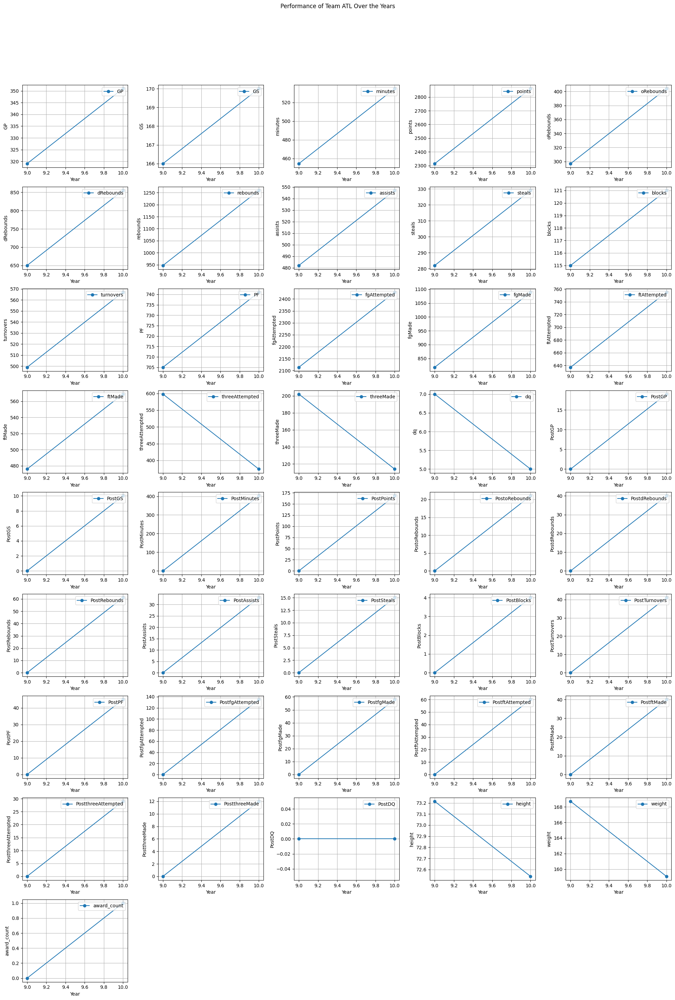

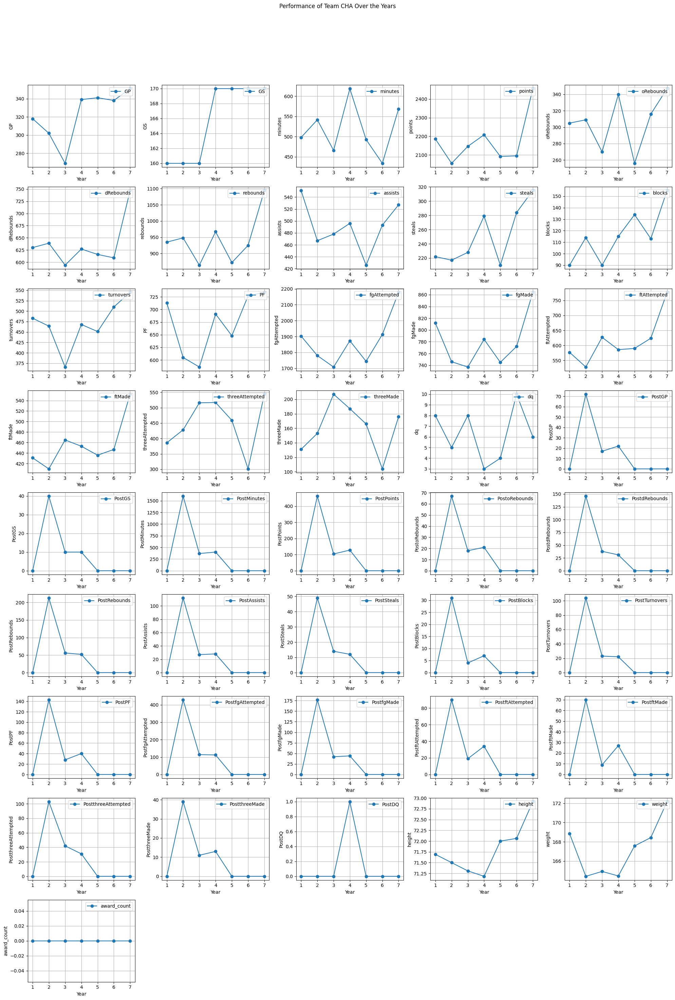

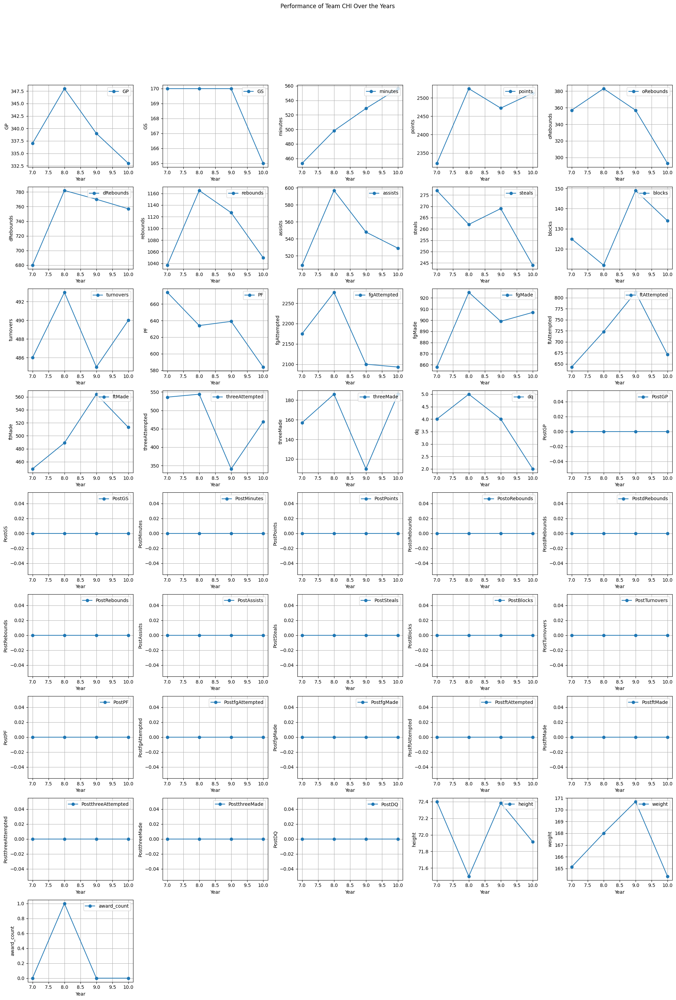

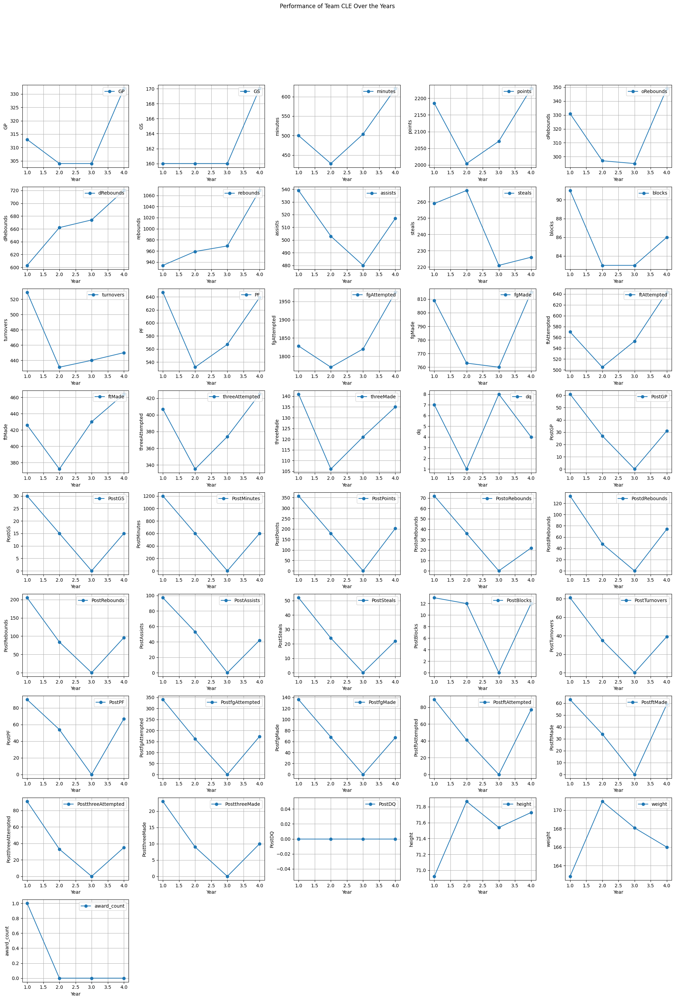

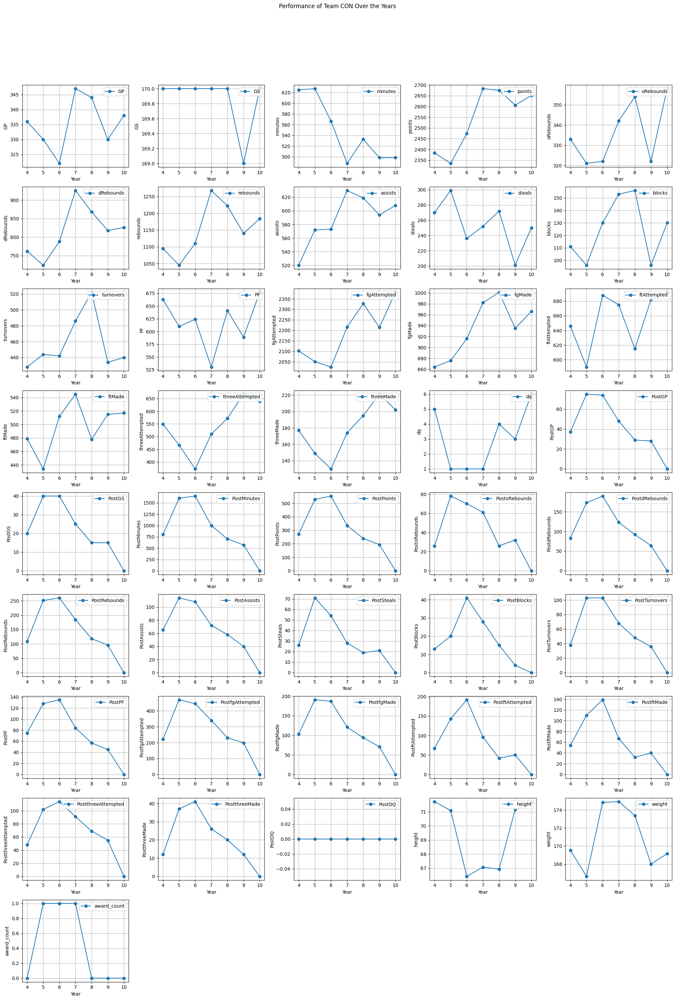

KeyboardInterrupt: 

In [ ]:
award_counts = df_awards_players.groupby(["year", "playerID"]).size().reset_index(name="award_count")

players_teams_info_df = pd.merge(df_players_teams, df_players, left_on='playerID', right_on='bioID', how='left')
players_teams_info_df = pd.merge(players_teams_info_df, award_counts, on=['playerID', 'year'], how='left')
agg_players_df = players_teams_info_df.groupby(["year", "tmID"]).agg({
    "GP": "sum",
    "GS": "sum",
    "minutes": "mean",
    "points": "sum",
    "oRebounds": "sum",
    "dRebounds": "sum",
    "rebounds": "sum",
    "assists": "sum",
    "steals": "sum",
    "blocks": "sum",
    "turnovers": "sum",
    "PF": "sum",
    "fgAttempted": "sum",
    "fgMade": "sum",
    "ftAttempted": "sum",
    "ftMade": "sum",
    "threeAttempted": "sum",
    "threeMade": "sum",
    "dq": "sum",
    "PostGP": "sum",
    "PostGS": "sum",
    "PostMinutes": "sum",
    "PostPoints": "sum",
    "PostoRebounds": "sum",
    "PostdRebounds": "sum",
    "PostRebounds": "sum",
    "PostAssists": "sum",
    "PostSteals": "sum",
    "PostBlocks": "sum",
    "PostTurnovers": "sum",
    "PostPF": "sum",
    "PostfgAttempted": "sum",
    "PostfgMade": "sum",
    "PostftAttempted": "sum",
    "PostftMade": "sum",
    "PostthreeAttempted": "sum",
    "PostthreeMade": "sum",
    "PostDQ": "sum",
    "height": "mean",
    "weight": "mean",
    "award_count": "sum",
    # Add more columns you want to aggregate here
}).reset_index()


# Define the columns to analyze (excluding "W" and "L")
columns_to_analyze = ["GP","GS","minutes","points","oRebounds","dRebounds","rebounds","assists","steals","blocks","turnovers","PF","fgAttempted","fgMade","ftAttempted","ftMade","threeAttempted","threeMade","dq","PostGP","PostGS","PostMinutes","PostPoints","PostoRebounds","PostdRebounds","PostRebounds","PostAssists","PostSteals","PostBlocks","PostTurnovers","PostPF","PostfgAttempted","PostfgMade","PostftAttempted","PostftMade","PostthreeAttempted","PostthreeMade","PostDQ", "height","weight","award_count"]
# Add other characteristics to analyze as needed

num_columns = 5  # Adjust as needed
num_rows = len(columns_to_analyze) // num_columns + 1

# Iterate through teams and create a grid of subplots for each team
for team_name in team_names:
    team_data = agg_players_df[agg_players_df['tmID'] == team_name]

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 30))
    axes = axes.flatten()  # Flatten the 2D array to a 1D array for indexing

    for i, column in enumerate(columns_to_analyze):
        axes[i].plot(team_data['year'], team_data[column], label=f'{column}', marker='o')
        axes[i].set_xlabel('Year')
        axes[i].set_ylabel(f'{column}')
        axes[i].legend(loc='upper right')
        axes[i].grid(True)

    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'Performance of Team {team_name} Over the Years')
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()

## Coaches

In [ ]:
df_coaches.head()

,coachID,year,tmID,lgID,stint,won,lost,post_wins,post_losses
0,adamsmi01w,5,WAS,WNBA,0,17,17,1,2
1,adubari99w,1,NYL,WNBA,0,20,12,4,3
2,adubari99w,2,NYL,WNBA,0,21,11,3,3
3,adubari99w,3,NYL,WNBA,0,18,14,4,4
4,adubari99w,4,NYL,WNBA,0,16,18,0,0


In [ ]:
df_coaches.describe()

,year,stint,won,lost,post_wins,post_losses
count,162.000000,162.000000,162.000000,162.000000,162.000000,162.000000
mean,5.314815,0.364198,14.672840,14.623457,1.166667,1.172840
std,2.896715,0.693861,6.403445,5.678789,1.953656,1.316782
min,1.000000,0.000000,0.000000,2.000000,0.000000,0.000000
25%,3.000000,0.000000,10.000000,11.000000,0.000000,0.000000
50%,5.000000,0.000000,16.000000,15.000000,0.000000,0.000000
75%,8.000000,0.000000,18.750000,18.000000,1.000000,2.000000
max,10.000000,2.000000,28.000000,30.000000,7.000000,5.000000


In [ ]:
df_coaches.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162 entries, 0 to 161
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   coachID      162 non-null    object
 1   year         162 non-null    int64 
 2   tmID         162 non-null    object
 3   lgID         162 non-null    object
 4   stint        162 non-null    int64 
 5   won          162 non-null    int64 
 6   lost         162 non-null    int64 
 7   post_wins    162 non-null    int64 
 8   post_losses  162 non-null    int64 
dtypes: int64(6), object(3)
memory usage: 11.5+ KB


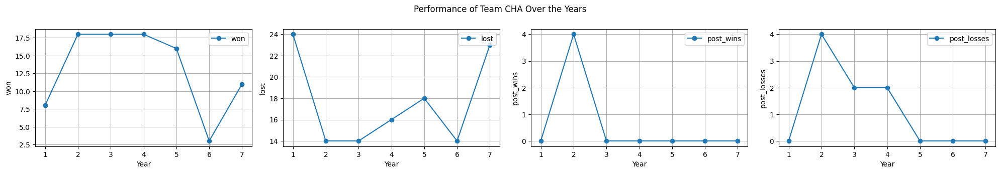

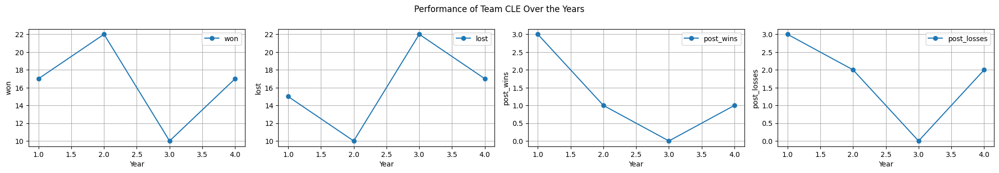

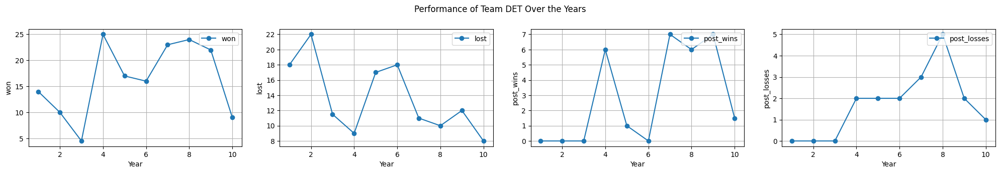

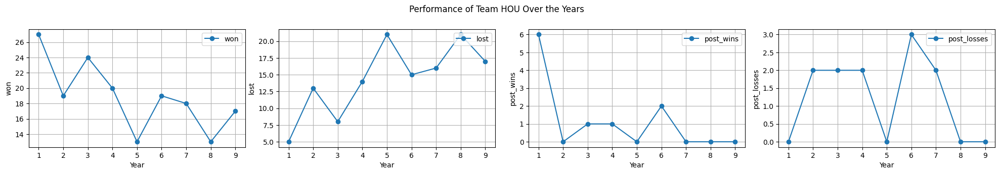

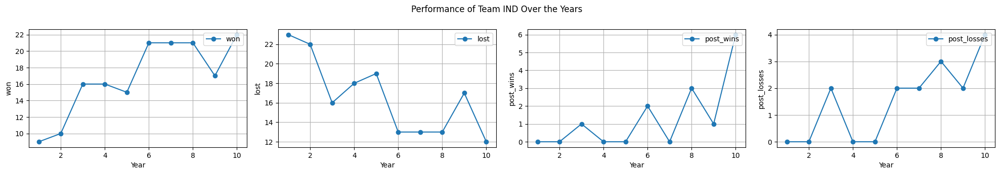

...

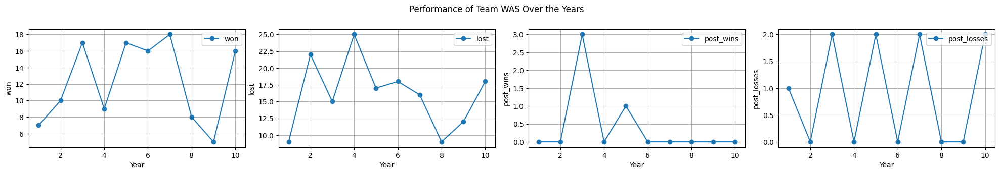

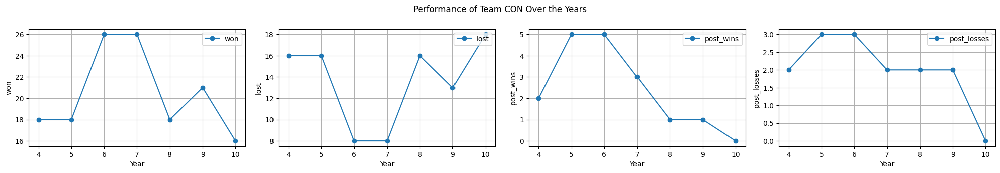

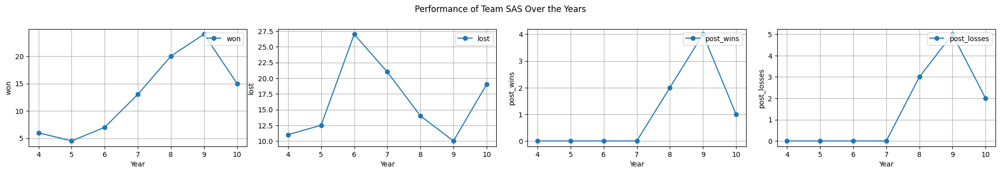

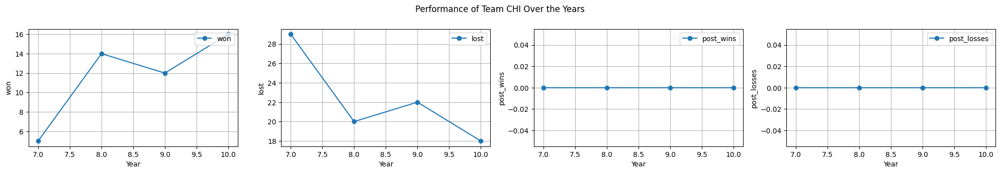

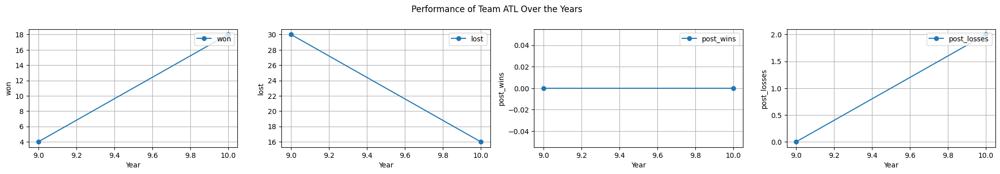

In [ ]:
agg_coach_data = df_coaches.groupby(['year', 'tmID']).agg({
    'won': 'mean',
    'lost': 'mean',
    'post_wins': 'mean',
    'post_losses': 'mean',
    # Add more columns as needed for analysis
}).reset_index()

# Define the columns to analyze
columns_to_analyze = ['won', 'lost', 'post_wins', 'post_losses']
# Add more columns as needed for analysis

# Number of columns and rows for the subplots grid
num_columns = 4  # Adjust as needed
num_rows = (len(columns_to_analyze) // num_columns) + 1

# Get a list of unique team names
team_names = agg_coach_data['tmID'].unique()

# Iterate through teams and create a grid of subplots for each team
for team_name in team_names:
    team_data = agg_coach_data[agg_coach_data['tmID'] == team_name]

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 6))
    axes = axes.flatten()  # Flatten the 2D array to a 1D array for indexing

    for i, column in enumerate(columns_to_analyze):
        axes[i].plot(team_data['year'], team_data[column], label=f'{column}', marker='o')
        axes[i].set_xlabel('Year')
        axes[i].set_ylabel(f'{column}')
        axes[i].legend(loc='upper right')
        axes[i].grid(True)

    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(f'Performance of Team {team_name} Over the Years')
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.show()



